_____

<table align="left" width=100%>
    <td>
        <div style="text-align: center;">
          <img src="./images/bar.png" alt="entidades financiadoras"/>
        </div>
    </td>
    <td>
        <p style="text-align: center; font-size:24px;"><b>Introduction to Data Science</b></p>
        <p style="text-align: center; font-size:18px;"><b>Master in Electrical and Computer Engineering</b></p>
        <p style="text-align: center; font-size:14px;"><b>Pedro Cardoso (pcardoso@ualg.pt)</b></p>
    </td>
</table>

_____

__Short Lesson Title:__ Exploratory Time Series Analysis

*__Summary:__ Building on the introductory lesson, this notebook delves into practical exploratory analysis of time series data. Students will learn techniques for visualizing time series data using various plotting methods, identifying patterns, trends, and seasonality. The lesson will likely cover methods for handling missing data and outliers specific to time series. Students will practice applying these techniques to real-world datasets, gaining practical skills in understanding and interpreting time series data.*

# Exploratory analysis of TS data

## Introduction
I **time series (TS)** data is a sequence of data points collected at regular intervals over time. Time series data is commonly used in a wide range of applications, such as finance, economics, weather forecasting, and many others. Analyzing time series data can help identify trends, patterns, and relationships in the data, as well as make predictions about future values.

For example
- **Stock market data**: Stock prices are collected at regular intervals, such as daily or hourly, and can be used to analyze trends in the stock market and make predictions about future prices.
- **Weather data**: Weather data is collected at regular intervals, such as hourly or daily, and can be used to analyze patterns in temperature, precipitation, and other weather variables.
- **Building energy consumption**: Energy consumption data is collected at regular intervals, such as hourly or daily, and can be used to analyze patterns in energy usage and make predictions about future consumption.
- etc.


### How to explore time series data?

There are several ways to explore a time series, including:

1. **Plotting the time series**: A simple line plot of the data over time can provide insights into trends, seasonality, and other patterns in the data.
2. **Decomposition**: Decomposing a time series into its **trend, seasonal, and residual components** can help identify underlying patterns and trends.
3. **Autocorrelation**: Autocorrelation measures the **correlation between a time series and a lagged version of itself**. Examining autocorrelation plots can help identify patterns such as seasonality or random noise.
4. **Time series forecasting**: Using statistical or machine learning models to forecast future values of the time series can help identify potential future trends or patterns.
5. **Spectral analysis**: Spectral analysis can help identify the frequency components of a time series, which can be useful in identifying seasonal or cyclical patterns.
6. **Clustering and classification**: Clustering and classification techniques can be used to group similar time series together or classify them based on certain characteristics, which can provide insights into patterns or trends across multiple time series.
7. **Time series anomaly detection**: Identifying outliers or anomalies in a time series data can provide insights into unusual patterns or events that might be affecting the series.
8. **Correlation analysis**: Correlation analysis can be used to examine the **relationship between a time series and other variables**, such as economic indicators or weather data.
9. **Time series smoothing**: Smoothing techniques such as **moving averages or exponential smoothing** can help reduce noise and highlight underlying patterns in the data.
10. **Time series feature extraction**: Feature extraction techniques can be used to identify relevant features in a time series that can be used for prediction or classification purposes.
11. **Granger causality analysis**: Granger causality analysis can help identify the **causal relationships between multiple time series**, which can be useful in identifying important drivers of trends or patterns.
12. **Event detection**: Event detection can help identify specific events that might be affecting a time series, such as major news events or policy changes

Overall, exploring a time series involves a combination of visualizations, statistical analyses, and modeling techniques to identify patterns and trends in the data, and to uncover potential drivers of those patterns.

## Plotting Time Series

There are several libraries available in Python for plotting time series data, some of the popular libraries are:

1. **Matplotlib**: Matplotlib is a powerful plotting library for Python. It provides several functions for creating line plots, scatter plots, bar charts, and other types of visualizations. Matplotlib is the foundation for many other plotting libraries in Python.
1. **Seaborn**: Seaborn is a data visualization library that builds on top of Matplotlib. It provides functions for creating more complex plots, such as heatmaps, pair plots, and violin plots. Seaborn is particularly useful for visualizing statistical relationships in data.
1. **Plotly**: Plotly is an interactive visualization library that can be used to create dynamic and interactive plots, such as line plots, scatter plots, and heatmaps. Plotly allows for interactive zooming and panning, as well as hover effects and other features.
1. **Bokeh**: Bokeh is another interactive visualization library for Python. It provides tools for creating interactive and zoomable plots, as well as widgets for controlling the visualization. Bokeh is particularly useful for creating web-based dashboards and other interactive visualizations.
1. **Pandas**: Pandas is a powerful data analysis library in Python that provides several functions for working with time series data. Pandas has built-in functions for creating line plots, scatter plots, and other types of visualizations, as well as time series-specific functions such as rolling means and resampling.

These libraries provide several options for visualizing time series data in Python, and the choice of library depends on the specific needs of the analysis and the preferences of the user.


There are several types of plots that can be used to visualize time series data, some of the most common ones include:

### Line plot
A line plot is a basic plot that shows how the value of a variable changes over time. It is a good choice for visualizing trends in the data over time, as well as identifying seasonal or cyclical patterns.


In [1]:
# !pip install calplot
# !pip install mplfinance
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calplot
import mplfinance as mpf
import pandas_bokeh
import numpy as np

# set pandas_bokeh to output inline
pandas_bokeh.output_notebook()

Loading BokehJS ...

We'll use the stock market data which was downloaded from the [Yahoo Finance](https://finance.yahoo.com/) website. The used script will be available in the [data folder](./data/stock_market/download_data.ipynb) and allow you to update the data. However, note that updating the data will change the results of the plots and consequently the results of the analysis.

The data is stored in a csv file, which can be loaded into a pandas dataframe. 

Note the `parse_dates=True` argument, which tells pandas to parse the 'Date' column as a datetime object. This allows us to easily work with the dates in the time series data.

In [2]:
# load data
df_stocks = pd.read_csv('./data/stock_market/stocks.csv', 
                        index_col='Date', 
                        parse_dates=True)

In [3]:
#df_stocks.dropna(inplace=True)
df_stocks.head()

,Open_META,High_META,Low_META,Close_META,Volume_META,Open_GOOGL,High_GOOGL,Low_GOOGL,Close_GOOGL,Volume_GOOGL,...,Open_AAPL,High_AAPL,Low_AAPL,Close_AAPL,Volume_AAPL,Open_AMZN,High_AMZN,Low_AMZN,Close_AMZN,Volume_AMZN
Date,,,,,,,,,,,,,,,,,,,,,
1990-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.314732,0.334821,0.312500,0.332589,183198400,NaN,NaN,NaN,NaN,NaN
1990-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.339286,0.339286,0.334821,0.334821,207995200,NaN,NaN,NaN,NaN,NaN
1990-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.341518,0.345982,0.332589,0.335938,221513600,NaN,NaN,NaN,NaN,NaN
1990-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.337054,0.341518,0.330357,0.337054,123312000,NaN,NaN,NaN,NaN,NaN
1990-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.334821,0.339286,0.330357,0.339286,101572800,NaN,NaN,NaN,NaN,NaN


For each stock there is the open, high, low, close, and volume values. The scocks considered are AAPL, AMZN, GOOGL, META, TSLA, and MSFT.

In [4]:
list_of_stocks =  ['AAPL', 'AMZN', 'GOOGL', 'META', 'TSLA', 'MSFT']


For our first example, we'll only plot the close values, using the plot function of **pandas**

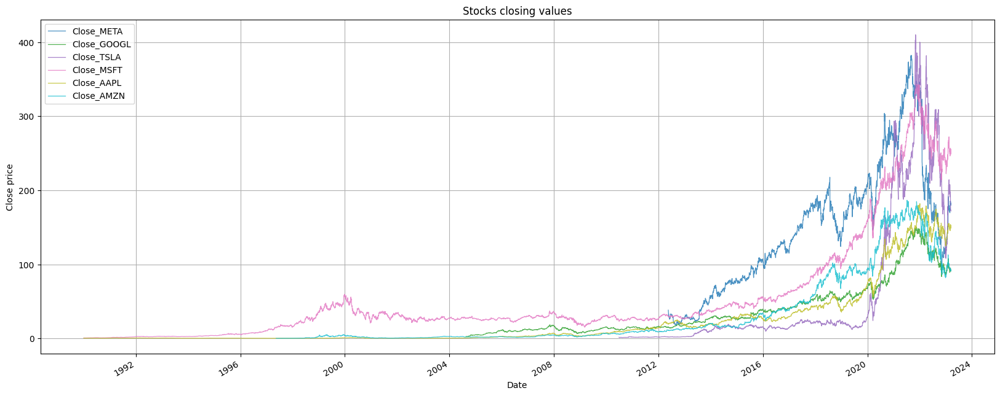

In [5]:
# choose the 'Close' columns
close_cols = [col for col in df_stocks.columns if 'Close' in col]

# plot the closing values
_ = df_stocks[close_cols].plot(figsize=(20,8),
                               title='Stocks closing values',
                               xlabel='Date',
                               ylabel='Close price',
                               grid=True,
                               legend=True,
                               colormap='tab10',
                               alpha=0.8,
                               linewidth=0.9)



As an alternative, we can use **seaborn** to plot the closing values

Text(0, 0.5, 'Close price')

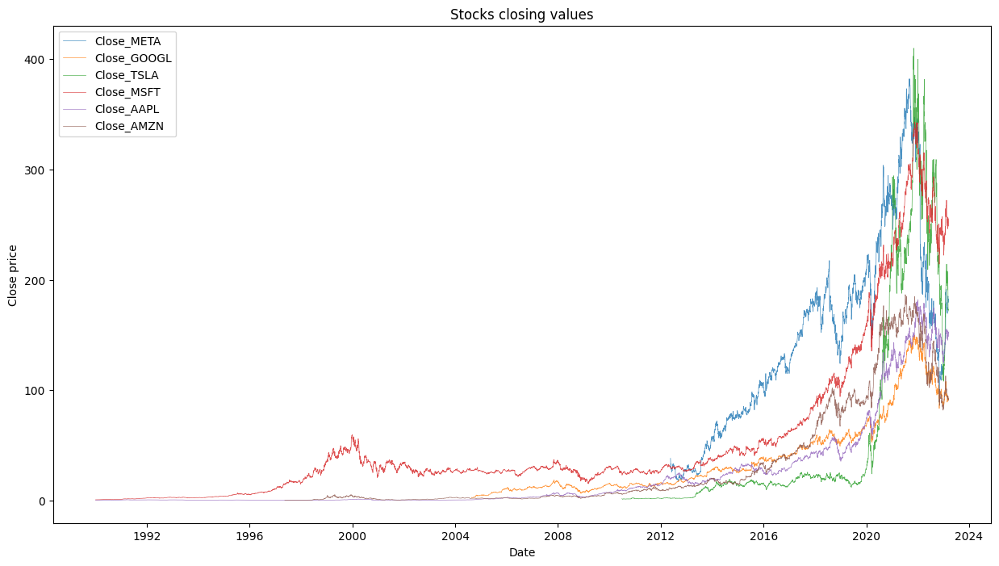

In [6]:
# plot the closing values
plt.figure(figsize=(15,8))
ax = sns.lineplot(data=df_stocks[close_cols], 
                 dashes=False,
                 palette='tab10',
                 linewidth=0.5,
                 alpha=0.8,
                 markers=False)
ax.set_title('Stocks closing values')
ax.set_xlabel('Date')
ax.set_ylabel('Close price')


Or the bokeh library

In [8]:
_ = df_stocks[close_cols].plot_bokeh(
    figsize=(1200,600),
    legend = "top_left",
    ylabel = "Close price",
    xlabel = "Date",
    title = "Stocks closing values",
)

Other variation can also be plotted as the percentage of variation of the stocks in predetermined periods.

For this, we do a resample of the data to aggregate the values in the desired periods. For example, we can aggregate the max closing values of the AAPL stock in 15 days periods.

In [9]:
# resample the data to get the max closing values in 15 days periods
df_stocks['Close_AAPL'].resample('15D').max()

Date
1990-01-02      0.339286
1990-01-17      0.305804
1990-02-01      0.312500
1990-02-16      0.305804
1990-03-03      0.359375
                 ...    
2023-01-09    141.110001
2023-01-24    154.649994
2023-02-08    155.330002
2023-02-23    153.830002
2023-03-10    152.654999
Freq: 15D, Name: Close_AAPL, Length: 809, dtype: float64

To plot the variation of the stocks in different periods, we can use the aggregation and plot functions of pandas. Let's first define a function to compute the variation of the stocks in the given period. See the possible intervals in https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects.

In [10]:
def compute_variation(df, aggr_flag):
    """
    Compute the variation of the stock in the given period
    """
    # get the close and open columns
    close_cols = [col for col in df.columns if 'Close' in col]
    close_cols.sort()

    open_cols = [col for col in df.columns if 'Open' in col]
    open_cols.sort()

    # close cols without suffix
    cols = [col.split('_')[1] for col in close_cols]

    # compute the period's opening values
    open_df = df[open_cols].resample(aggr_flag).first()
    open_df.columns = cols

    # compute the period's closing values
    close_df = df[close_cols].resample(aggr_flag).last()
    close_df.columns = cols

    return close_df - open_df

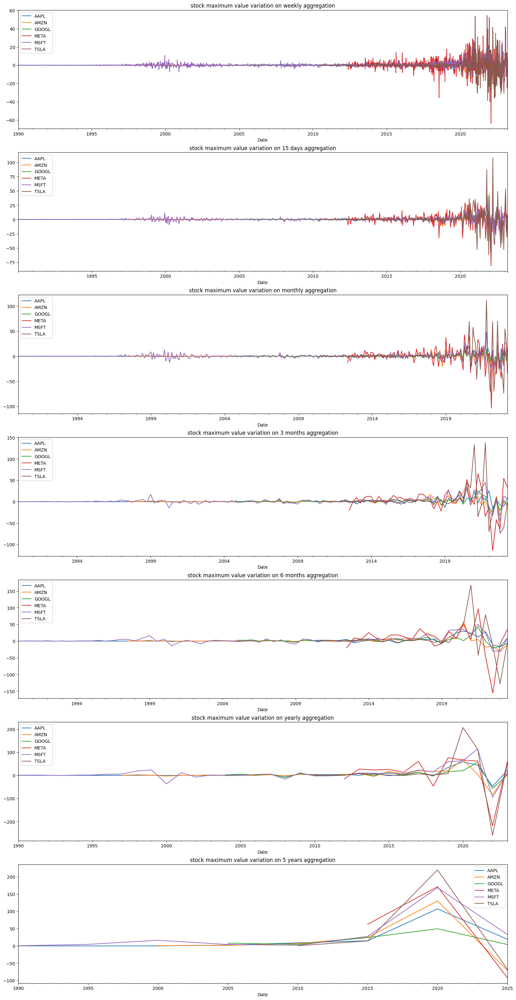

In [11]:
# plot the variation of the stocks
list_of_aggr = ['W', '15D', 'ME', '3ME', '6ME', 'YE', '5YE']
list_of_msg = ['weekly', '15 days', 'monthly', '3 months', '6 months', 'yearly', '5 years']

n_plots = len(list_of_aggr)

fig, ax = plt.subplots(n_plots, figsize=(20,40))

for i, aggr_flag, msg in zip(range(n_plots), list_of_aggr, list_of_msg):
    delta_for_period = compute_variation(df_stocks, aggr_flag)
    delta_for_period.plot(ax=ax[i], title=f"stock maximum value variation on {msg} aggregation")

### Scatter plot
A scatter plot is a plot that shows the relationship between two variables. It can be useful for identifying relationships between variables in time series data, as well as identifying outliers or anomalies.

For example, you can see the obvious relationship between opening and closing of the AAPL stock

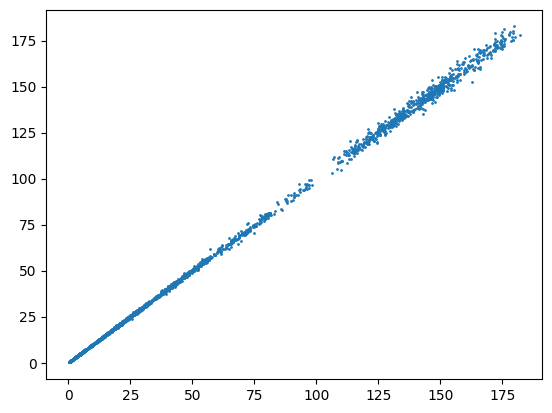

In [12]:
_ = plt.scatter(x=df_stocks['Close_AAPL'], y=df_stocks['Open_AAPL'], s=1)

 And below a scatter plot with openings of AAPL and GOOGL, which show also a correlation between the opening values  of the stocks

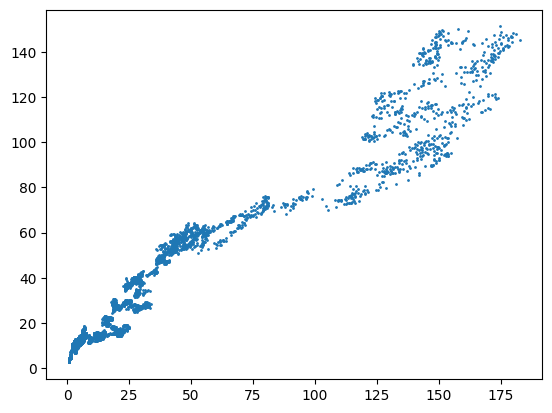

In [13]:
_ = plt.scatter(x=df_stocks['Open_AAPL'], y=df_stocks['Open_GOOGL'], s=1)

A matrix of scatter plots can also be made in a simple manner by using the pandas scatter_matrix function

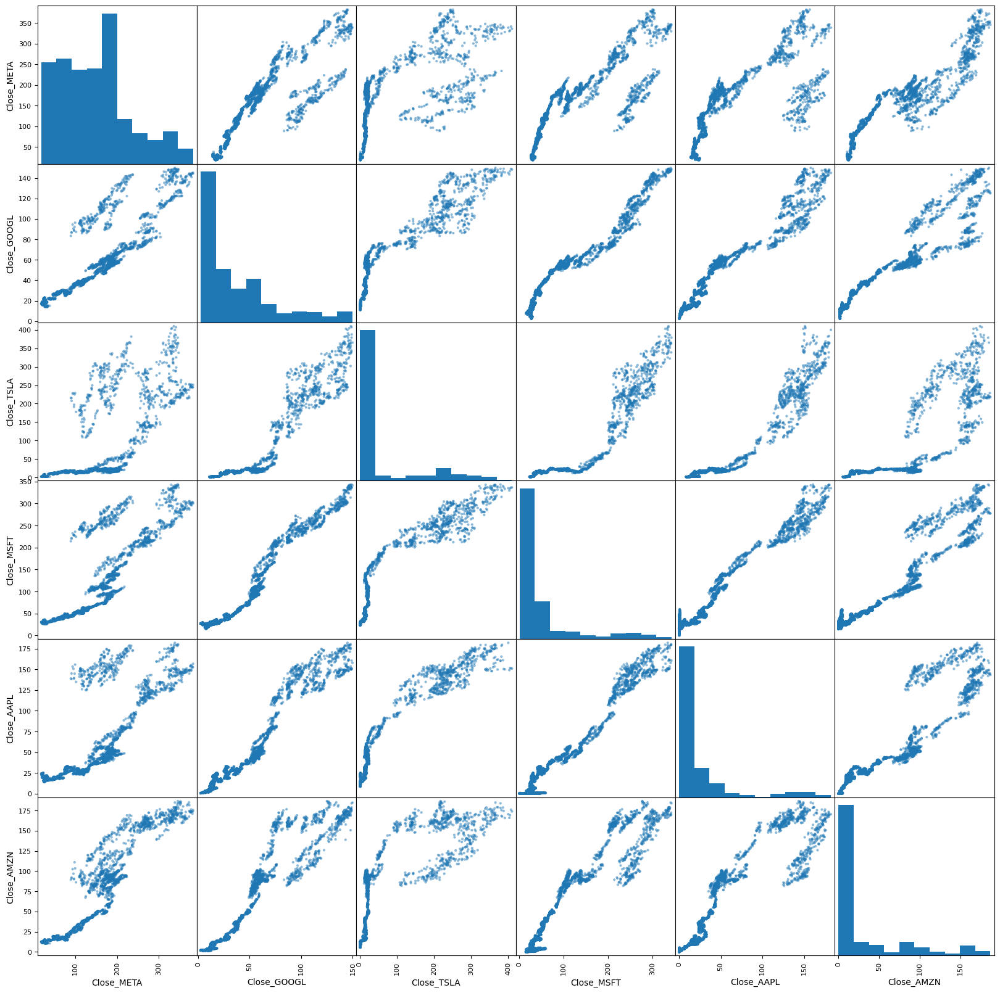

In [14]:
_ = pd.plotting.scatter_matrix(df_stocks[close_cols], 
                               figsize=(20,20),
                               diagonal='hist')

For instance, we can also plot the daily valorization (close - opening) of the stocks. The diagonal shows an the histogram of the valorization.

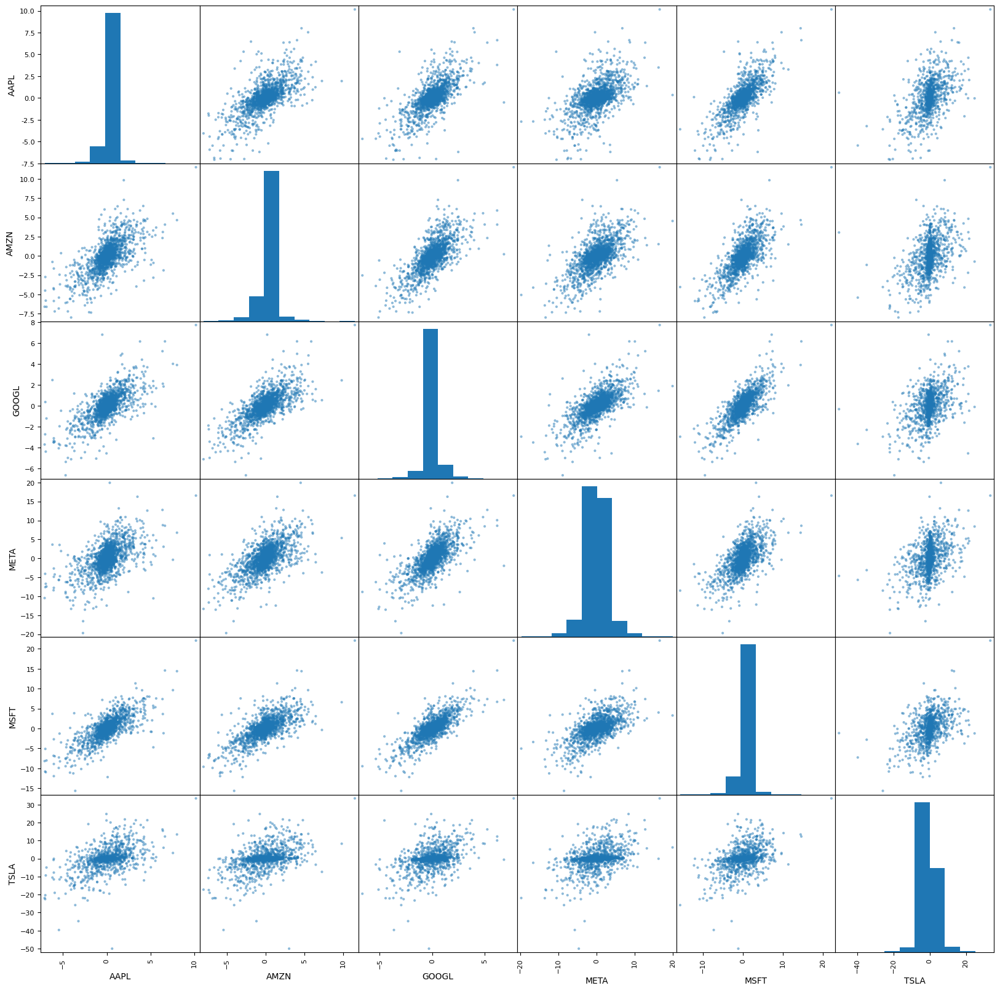

In [15]:
# plot the valorization
daily_delta = compute_variation(df_stocks, 'D')

_ = pd.plotting.scatter_matrix(daily_delta, figsize=(20,20))

### Bar chart
A bar chart is a plot that shows the frequency of a categorical variable. It can be used to visualize the frequency of events that occur over time, such as the number of sales in a given month or the number of website visits in a given week.

For example, we can plot yearly valorization of the stocks...

In [16]:
# build the data yearly aggregated
# to simplify, we only consider the closing of the last and first day of the year
df_delta_year = compute_variation(df_stocks, 'YE')
df_delta_year.tail()

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
Date,,,,,,
2019-12-31,34.689999,19.131996,15.609497,76.259995,58.149994,7.481998
2020-12-31,58.630005,69.096497,20.211502,66.410004,63.639999,206.923328
2021-12-31,44.050003,3.216995,56.852005,61.570007,113.790009,112.440002
2022-12-31,-47.900009,-83.550003,-56.824989,-217.959991,-95.529999,-259.403343
2023-12-31,22.375000,7.280701,2.415001,59.734993,12.309998,53.389999


In [17]:

df_delta_year.index = df_delta_year.index.year
df_delta_year.tail()

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
Date,,,,,,
2019,34.689999,19.131996,15.609497,76.259995,58.149994,7.481998
2020,58.630005,69.096497,20.211502,66.410004,63.639999,206.923328
2021,44.050003,3.216995,56.852005,61.570007,113.790009,112.440002
2022,-47.900009,-83.550003,-56.824989,-217.959991,-95.529999,-259.403343
2023,22.375000,7.280701,2.415001,59.734993,12.309998,53.389999


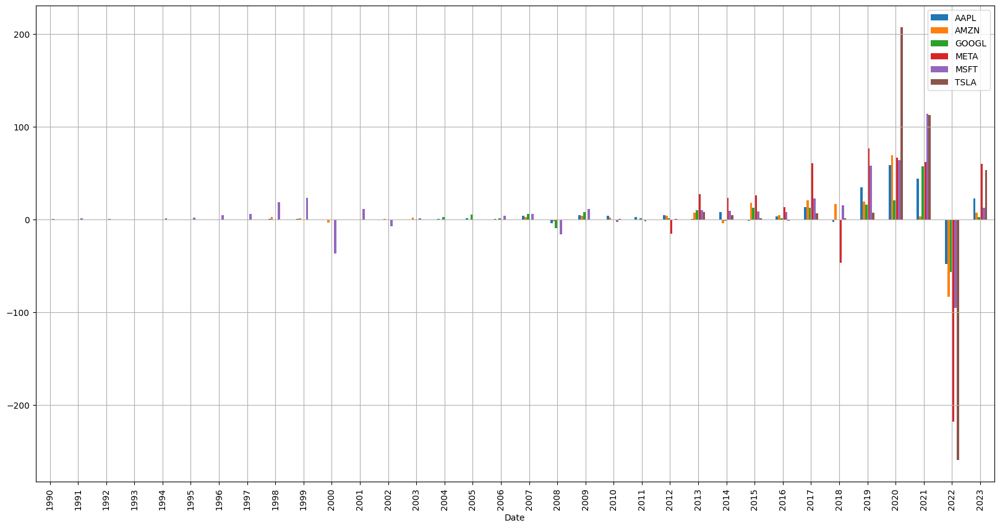

In [18]:
# plot it
ax = df_delta_year.plot(kind="bar",figsize=(20, 10), grid=True)

### Heatmap
A heatmap is a plot that shows the distribution of values in a two-dimensional grid. It can be used to visualize the relationship between two variables over time, such as the temperature and humidity in a given location over the course of a year.

For instance a plot of the correlation between daily stocks valorization can be done on the following way (TSLA is the one less correlated with the others)

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
AAPL,1.000000,0.656584,0.672004,0.544770,0.715683,0.505246
AMZN,0.656584,1.000000,0.706697,0.630343,0.679570,0.448301
GOOGL,0.672004,0.706697,1.000000,0.670914,0.770559,0.434042
META,0.544770,0.630343,0.670914,1.000000,0.608404,0.396855
MSFT,0.715683,0.679570,0.770559,0.608404,1.000000,0.450198
TSLA,0.505246,0.448301,0.434042,0.396855,0.450198,1.000000


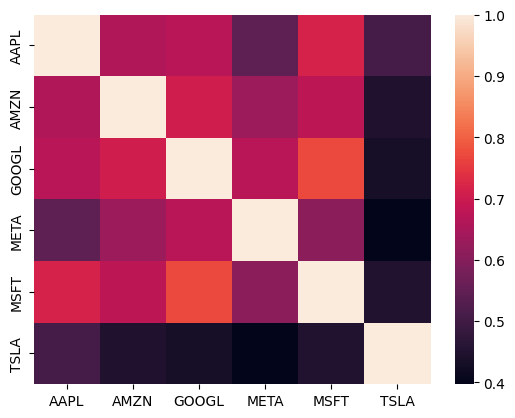

In [19]:
df_delta_daily = compute_variation(df_stocks, 'D')
corr_matrix = df_delta_daily.corr()
sns.heatmap(corr_matrix)
corr_matrix.style.background_gradient(cmap='coolwarm')

In the case of time series, it can plot the values against time. For example de variation of value GOOGL over 2021 and 2022 can be plotted as follows:

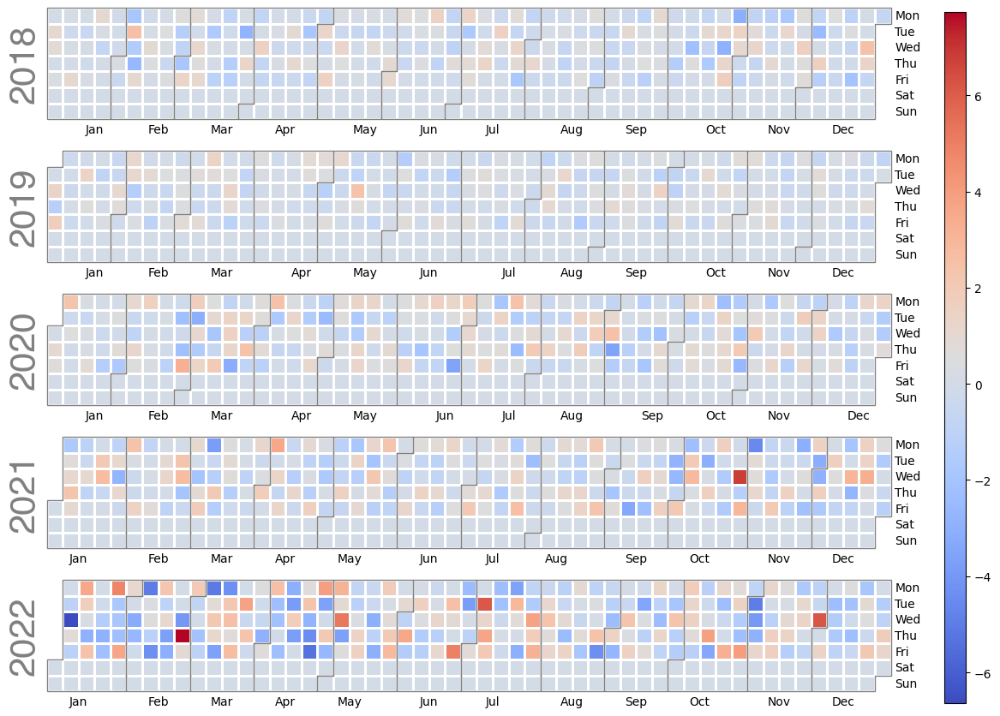

In [20]:
# the calplot library is needed - see https://calplot.readthedocs.io/en/latest/
data = df_delta_daily['GOOGL'].loc[df_delta_daily.index.year.isin([2018, 2019, 2020, 2021, 2022])]
calplot.calplot(data, 
                cmap="coolwarm", 
                colorbar=True);

### Box plot
A box plot is a plot that shows the distribution of a variable over time. It can be useful for identifying trends in the data, as well as outliers or anomalies.

In more detail, The box plot consists of a box and whiskers that represent the distribution of the data. The box represents the middle 50% of the data, with the bottom of the box indicating the 25th percentile and the top indicating the 75th percentile. The whiskers extend from the box to the minimum and maximum values.

To identify outliers, the interquartile range (IQR) is used. The interquartile range (IQR) is the distance between the 25th (Q1) and 75th (Q3) percentiles of the data. You can compute the IQR by subtracting the 25th percentile from the 75th percentile. Then outliers are points that fall outside the whiskers. The whiskers extend to 1.5 times the IQR below the 25th percentile and above the 75th percentile.

For example, we can plot the daily variation of the stocks

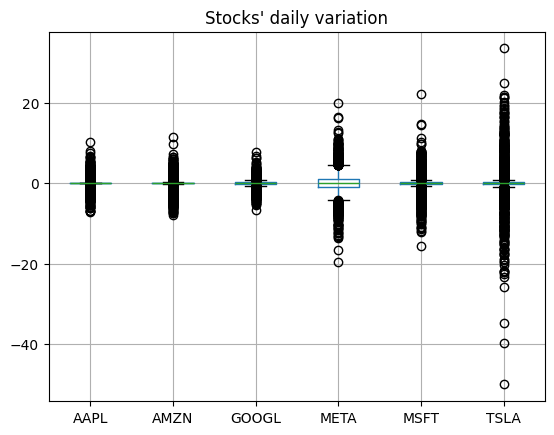

In [21]:
ax = df_delta_daily.boxplot(grid=True)
_ = ax.set_title("Stocks' daily variation")

With the above scales is hard to get an idea of the real values. But we can see more details asking for a description of the framework (below).

In [22]:
df_delta_daily.describe()

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
count,8363.000000,6499.000000,4673.000000,2721.000000,8363.000000,3198.000000
mean,0.012198,-0.012729,0.001390,0.043886,0.011549,-0.034900
std,0.731583,0.984245,0.766515,2.886703,1.303474,3.861679
min,-7.080002,-7.990494,-6.645004,-19.690002,-15.670013,-50.033356
25%,-0.020357,-0.081500,-0.165915,-1.019989,-0.190001,-0.224666
50%,0.000000,0.000000,0.000000,0.039993,0.000000,-0.001666
75%,0.026965,0.084750,0.179504,1.150002,0.228281,0.214001
max,10.160004,11.520508,7.737495,19.910004,22.079987,33.460007


We can also have a look at the monthly and yearly variations. Observe that the number of samples for the yearly variation is small.

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
count,399.000000,311.000000,224.000000,131.000000,399.000000,154.000000
mean,0.304628,0.220920,0.326244,0.680573,0.552886,0.487567
std,3.926436,5.369600,3.919668,16.981978,5.884938,20.721014
min,-18.440002,-39.868004,-25.390503,-103.529999,-31.850006,-73.900002
25%,-0.051897,-0.326063,-0.670931,-4.160000,-0.843750,-1.145500
50%,0.019531,0.073437,0.348922,2.140001,0.197917,0.048333
75%,0.331429,0.638501,1.286537,7.744999,1.690001,1.687333
max,26.470001,28.659996,13.598511,43.090012,49.500000,111.866669


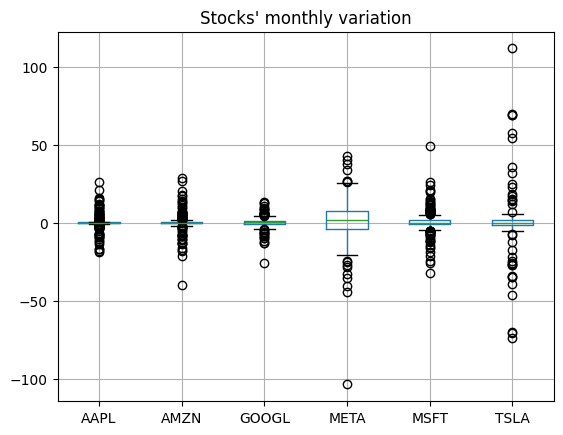

In [23]:
df_delta_month = compute_variation(df_stocks, 'ME')
ax = df_delta_month.boxplot(grid=True)
_ = ax.set_title("Stocks' monthly variation")

df_delta_month.describe()

,AAPL,AMZN,GOOGL,META,MSFT,TSLA
count,34.000000,27.000000,20.000000,12.000000,34.000000,14.000000
mean,4.412577,3.312091,4.361272,11.167085,7.336324,10.153332
std,16.582509,22.425823,19.708123,80.783413,31.070537,97.799736
min,-47.900009,-83.550003,-56.824989,-217.959991,-95.529999,-259.403343
25%,-0.069196,-0.325063,0.611713,5.967505,-0.062539,0.373667
50%,0.250502,2.187500,2.368536,26.645001,4.222969,3.113667
75%,3.968750,5.907251,10.599344,60.715008,11.034375,7.642000
max,58.630005,69.096497,56.852005,76.259995,113.790009,206.923328


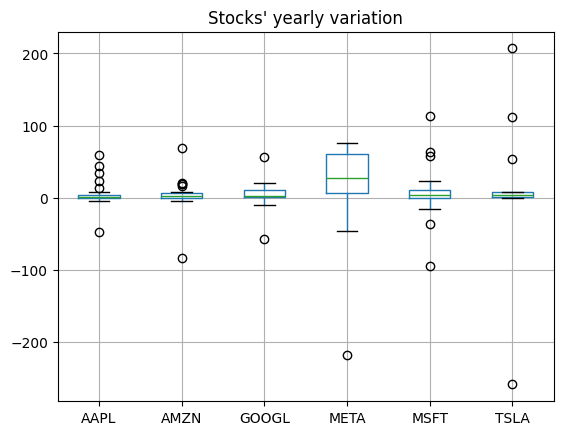

In [24]:
df_delta_year = compute_variation(df_stocks, 'YE')
ax = df_delta_year.boxplot(grid=True)
_ = ax.set_title("Stocks' yearly variation")

df_delta_year.describe()

### Histogram
A histogram is a plot that shows the distribution of a variable over time. It can be useful for identifying the frequency of events that occur at different points in time, such as the number of website visits during different times of the day.

In the following example, the histogram of the daily variations of AAPL is shown. The number of bins is the number of intervals the values interval is divided into.

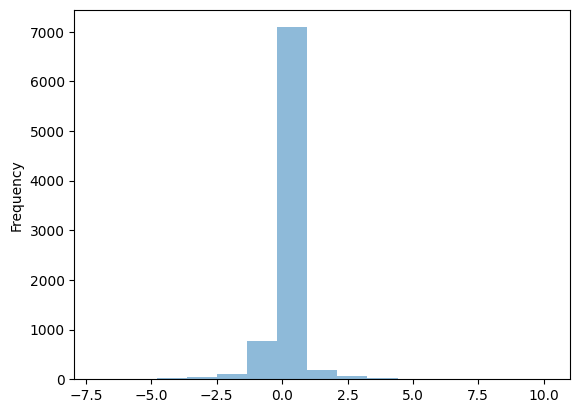

In [26]:
df_delta = compute_variation(df_stocks, 'D')
_ = df_delta['AAPL'].plot(kind='hist', alpha=0.5, bins=15)

And the histogram of the quarters variations of AAPL is the following:

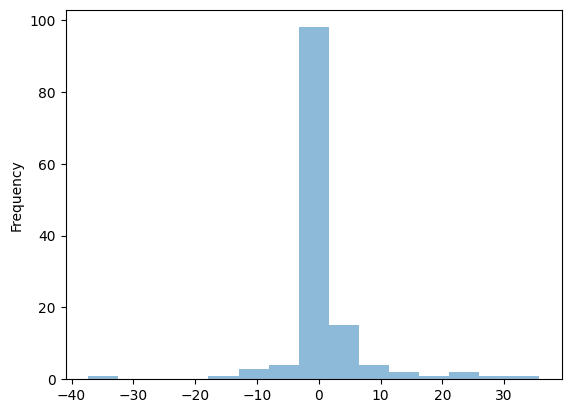

In [27]:
df_delta = compute_variation(df_stocks, 'QE')
_ = df_delta['AAPL'].plot(kind='hist', alpha=0.5, bins=15)

### Area plot
 An area plot is a plot that shows the area under a line plot. It can be used to visualize the total value of a variable over time, as well as the distribution of the variable over time.

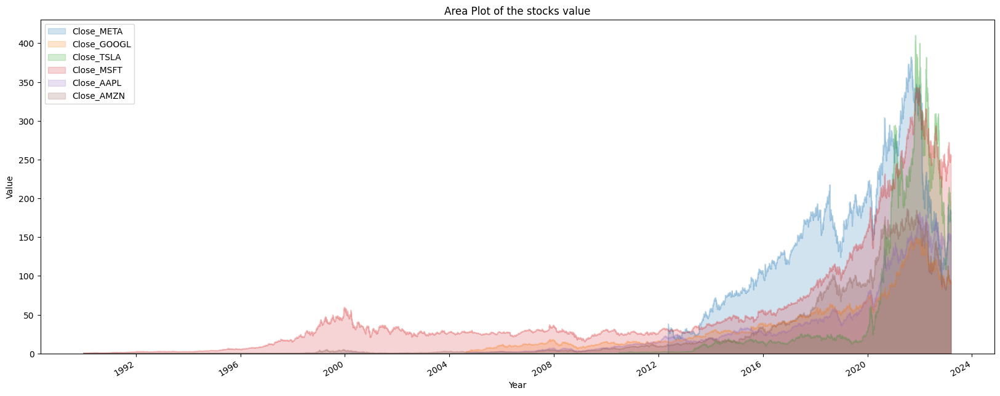

In [28]:
ax = df_stocks[close_cols].plot.area(stacked=False, alpha=0.2, figsize=(20,8))

# Customize the plot
ax.set_title('Area Plot of the stocks value')
ax.set_xlabel('Year')
ax.set_ylabel('Value')
ax.legend()

### Stacked area plot
A stacked area plot is a plot that shows the distribution of multiple variables over time. It can be useful for visualizing the total value of multiple variables over time, as well as the relative contribution of each variable.

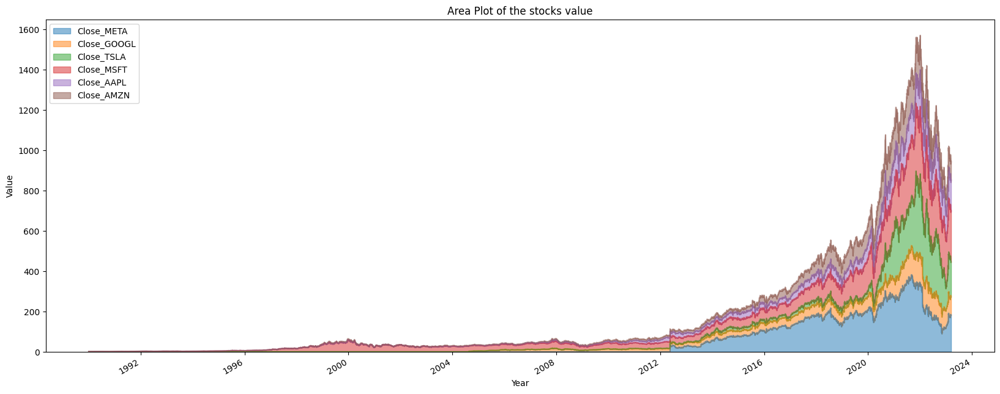

In [29]:
ax = df_stocks[close_cols].plot.area(stacked=True, alpha=0.5, figsize=(20,8))

# Customize the plot
ax.set_title('Area Plot of the stocks value')
ax.set_xlabel('Year')
ax.set_ylabel('Value')
ax.legend()

### Candlestick chart
A candlestick chart is a plot that shows the open, close, high, and low values of a variable over time. It can be useful for visualizing the price of a security or commodity over time, as well as identifying trends and patterns in the data.

In this case, the data has to be in the format of the mplfinance package (see https://pypi.org/project/mplfinance/ for more details), that is, a dataframe with columns Open, High, Low, Close, and optionally Volume and Datetime.

Its plot presents the daily variation and can be complemented with moving averages and volume, as below

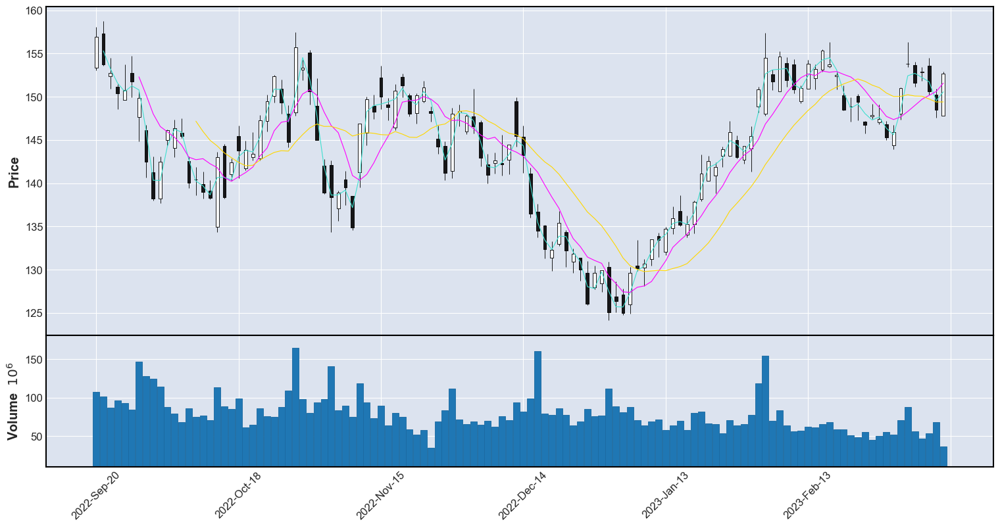

In [30]:
# get data for the last 120 days
n_days = 120
apple_cols = [col for col in df_stocks.columns if 'AAPL' in col]
df_AAPL = df_stocks.iloc[-n_days:,:][apple_cols]

# correct the name of the columns, so the mplfinance package  understands them
df_AAPL.columns = [col.split('_')[0] for col in df_AAPL.columns]

# plot
mpf.plot(df_AAPL,
         mav=(2, 7, 15), # moving averages of 2, 7, and 15 days
         volume=True,
         figsize=(20,10),
         type='candle', # possible types are: 'candle', 'ohlc', 'line', 'renko', 'pnf'
         )

### Combining plots
Combining plots is a useful technique in data visualization. Combining allow to compare multiple datasets, helping to visualize multiple datasets in the same plot, making it easier to compare them visually. For example, you can plot two or more lines on the same plot to compare the trend of multiple variables over time. It also allows to show different aspects of data, since combining different types of plots, such as scatter plots, bar charts, and histograms, can help you to show different aspects of your data. For example, you can use a scatter plot to show the relationship between two variables and a histogram to show the distribution of a single variable.

Let us see an example

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


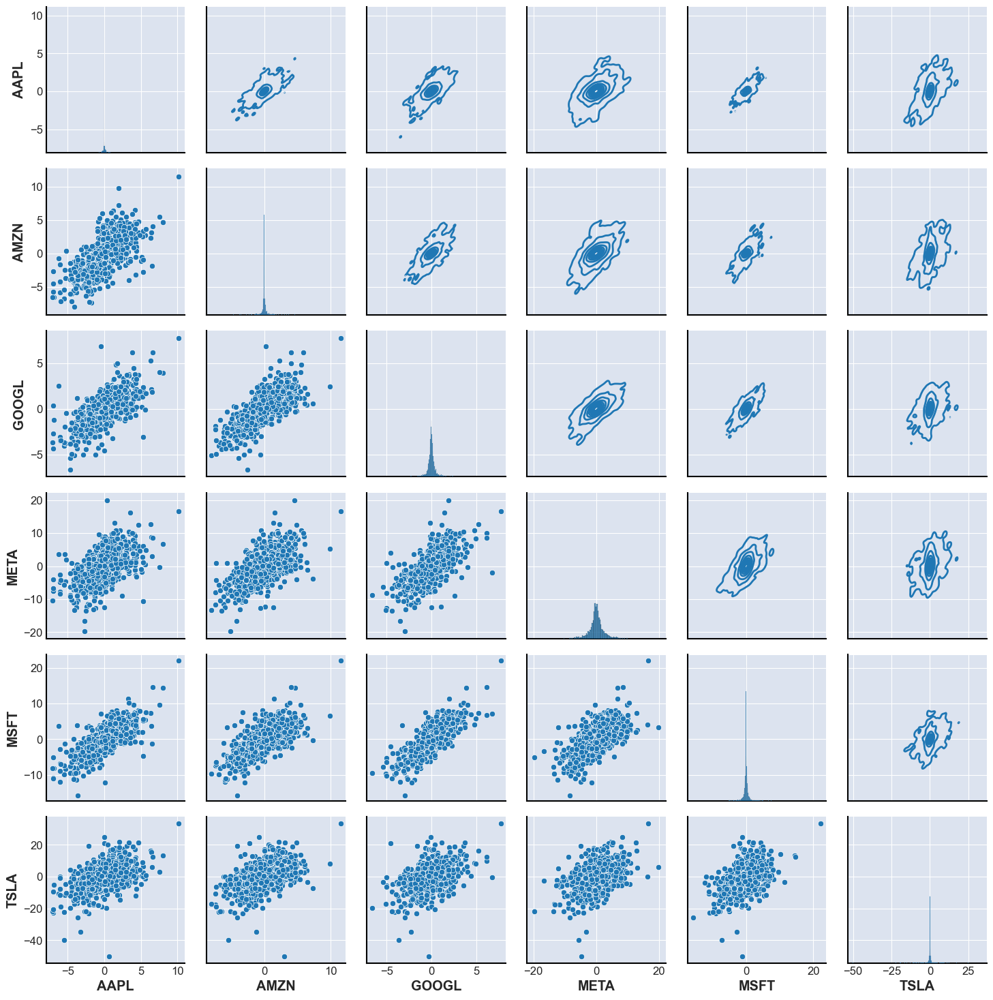

In [31]:
df_delta = compute_variation(df_stocks, 'D')

# define the pairplot
g = sns.PairGrid(df_delta)

# define the plots for the diagonal, lower, and upper triangles
g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot)

## Transform time series

Transform TS data for modeling allows to transform, rescale, smooth, and engineer features from time series data in order to best expose the underlying inherent properties of the problem (the signal) to forecasting learning algorithms.

Some examples are
- transforming
- rescaling
- smoothing
- etc.

### Transformation
Converting the data into a more suitable format, such as logarithmic or exponential transformations, to make the data conform more closely to certain statistical assumptions.

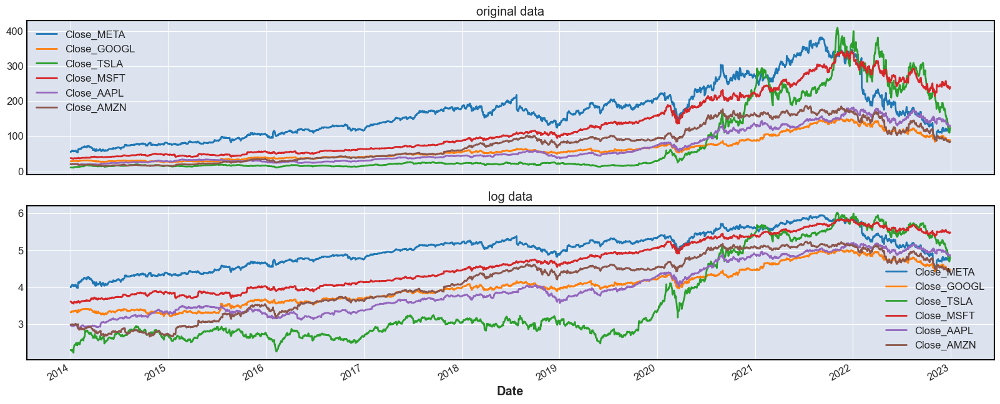

In [32]:
# get data between 2014 and 2022
df_close_14_22 = df_stocks.loc['2014-01-01':'2022-12-31', close_cols]
df_close_log = df_close_14_22.map(np.log)

fig, ax = plt.subplots(2,1, sharex=True, figsize=(20,8))

# plot of the original data
_ = df_close_14_22.plot(ax=ax[0], title='original data')

# plot the log data
_ = df_close_log.plot(ax=ax[1], title='log data')

### Rescaling

Scaling the data to a common range, such as between 0 and 1 or using standardization, can help to compare and interpret features across different time series.

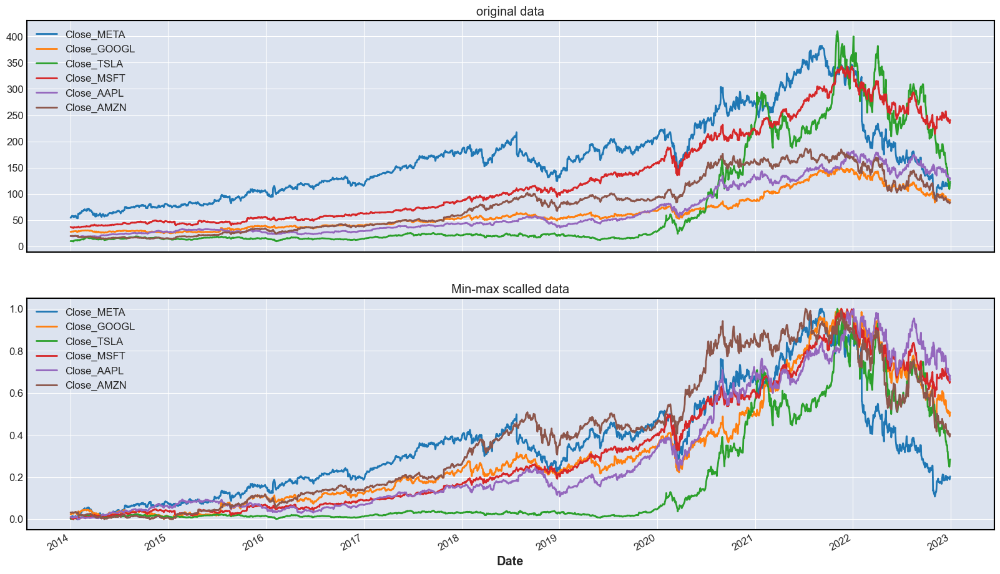

In [33]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_close_14_22),
                         index=df_close_14_22.index,
                         columns=df_close_14_22.columns)

fig, ax = plt.subplots(2,1, sharex=True, figsize=(20,12))

_ = df_close_14_22.plot(ax=ax[0], title='original data')
_ = df_scaled.plot(ax=ax[1], title='Min-max scalled data')

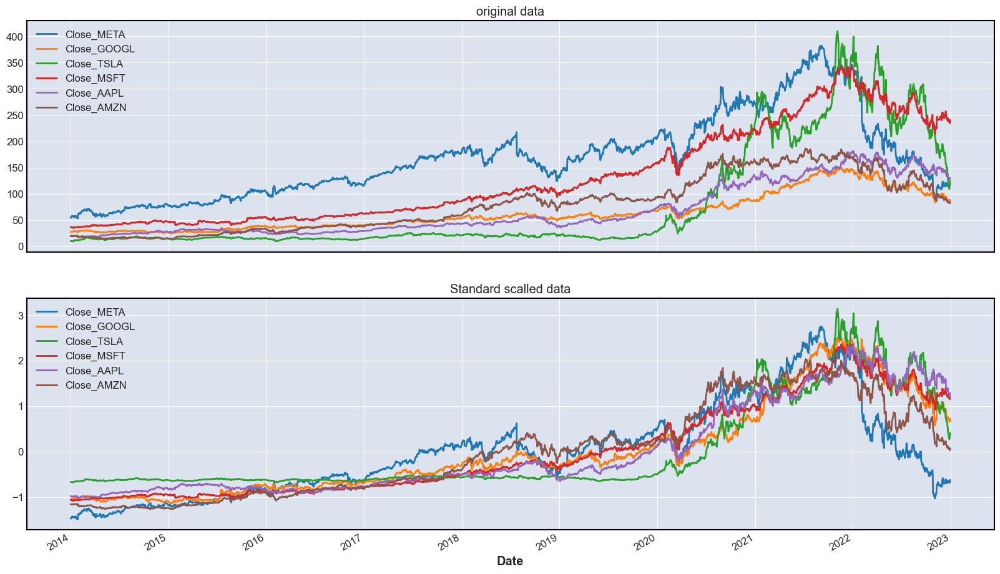

In [34]:
from sklearn.preprocessing import StandardScaler

# Assume ts_data is a numpy array containing the original time series data
scaler = StandardScaler()

df_scaled = pd.DataFrame(scaler.fit_transform(df_close_14_22),
                         index=df_close_14_22.index,
                         columns=df_close_14_22.columns
                         )


fig, ax = plt.subplots(2,1, sharex=True, figsize=(20,12))

_ = df_close_14_22.plot(ax=ax[0], title='original data')
_ = df_scaled.plot(ax=ax[1], title='Standard scalled data')

## Time series smoothing

Time series smoothing is a technique used to remove short-term fluctuations or noise from a time series data in order to better identify the long-term trends and patterns. The objective of time series smoothing is to improve the signal-to-noise ratio in the data by eliminating the random variations that make it difficult to detect the underlying trend or pattern.


Overall, time series smoothing can help to improve the accuracy of forecasting and prediction models by **reducing the effects of noise and random variations in the data**.

Time series smoothing can be used to remove different types of variations from the data, such as:
- **Seasonal variation**: Seasonal variation refers to the patterns that repeat periodically over time. For example, sales of air conditioners may increase during summer months and decrease during winter months.

- **Cyclical variation**: Cyclical variation refers to the patterns that repeat at irregular intervals. For example, the stock market may experience booms and busts over several years.

- **Random variation/noise**: Random variation refers to the unpredictable fluctuations in the data that are not related to any specific trend or pattern.

There are different techniques that can be used for time series smoothing, such as:

- **Moving average smoothing**
- **Exponential smoothing**
- **Seasonal decomposition**

#### Moving average smoothing
**Moving average smoothing**  is used to help reveal the trend of a time series dataset without all the noise. It is calculated by taking the average of the dataset over a sliding window of time. The window is specified by the width of the window in terms of the number of observations. For example, a window width of 3 would be a moving average calculated with 3 observations at a time. The moving average is calculated as the average of the observations in the window, where the window slides one observation at a time. This means that the first few moving average values are not a number until the window has observations to work with.

The values are calculated using the following formula:
$$ \frac{1}{n} \sum_{i=0}^{n-1} x_{t-i} $$
where $n$ is the window width and $x_{i}$ is the observation at time $i$.

### Window size
The window size in the moving average is an important parameter that determines the level of smoothing applied to the time series data. Generally, a larger window size results in a smoother time series with less detail and a smaller window size results in a more detailed time series with more noise.

Choosing an appropriate window size depends on the specific characteristics of the time series data and the goals of the analysis. Some general guidelines for selecting the window size in the moving average are:

- Consider the frequency of the data: a smaller window size may be appropriate to capture the short-term fluctuations in the data.  A larger window size may be appropriate to capture the longer-term trends and patterns in the data.

- Consider the length of the time series: If the time series data is short, then a smaller window size may be appropriate to avoid oversmoothing the data. If the time series data is long, then a larger window size may be appropriate to smooth out the noise in the data.

In the end, it is a good practice to experiment with different window sizes to determine the best value for the specific time series data and analysis goals. For example, you can try different window sizes and compare the resulting smoothed time series using visual inspection.

So let us try with other window sizes, which will remove those small peaks in the middle of the year

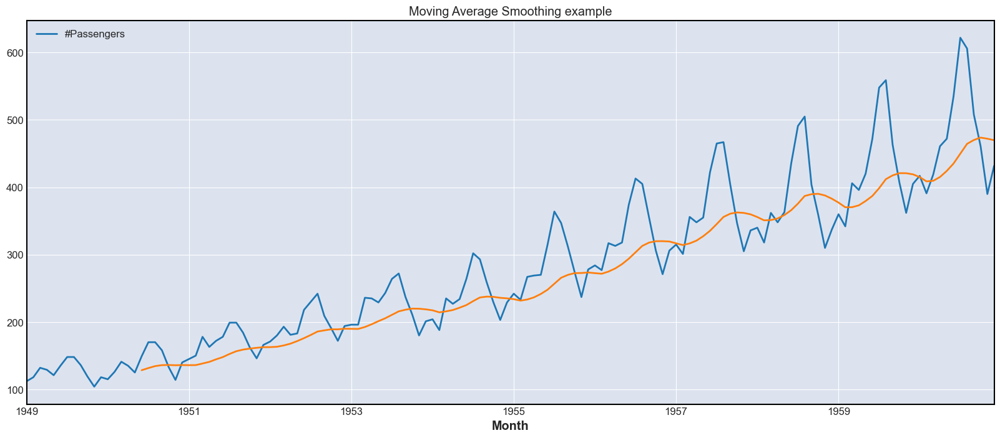

In [38]:
# load the data
df_passengers = pd.read_csv('data/passengers_TS/passengers.csv', index_col='Month', parse_dates=True)\
    .drop('Unnamed: 0', axis=1)

# Apply moving average
window_size = 12
rolling_mean = df_passengers['#Passengers'].rolling(window_size).mean()

# Plot original and smoothed time series data
ax = df_passengers.plot(label='Original Data', figsize=(20,8))
_ = rolling_mean.plot(ax=ax, label=f'{window_size}-Day Moving Average', title='Moving Average Smoothing example')

And with distinct window sizes

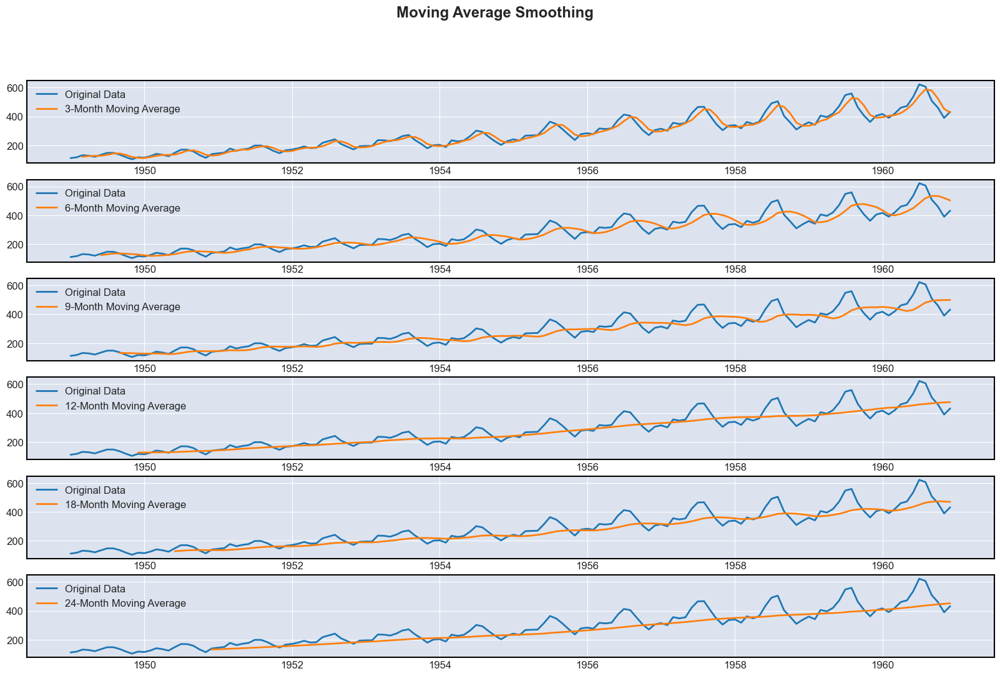

In [41]:
fig, axes = plt.subplots(4, 1, figsize=(20, 12))

for i, window_size in enumerate([3, 6, 9, 12, 12 * 2]):
    rolling_mean = df_passengers['#Passengers'].rolling(window_size).mean()

    # Plot original and smoothed time series data
    axes[i].plot(df_passengers.index, df_passengers['#Passengers'], label='Original Data')
    axes[i].plot(rolling_mean.index, rolling_mean, label=f'{window_size}-Month Moving Average')
    axes[i].legend()
    #axes[i].xlabel('Date')
    #axes[i].ylabel('Value')
fig.suptitle('Moving Average Smoothing')
plt.show()

And for the sunspots, also some examples

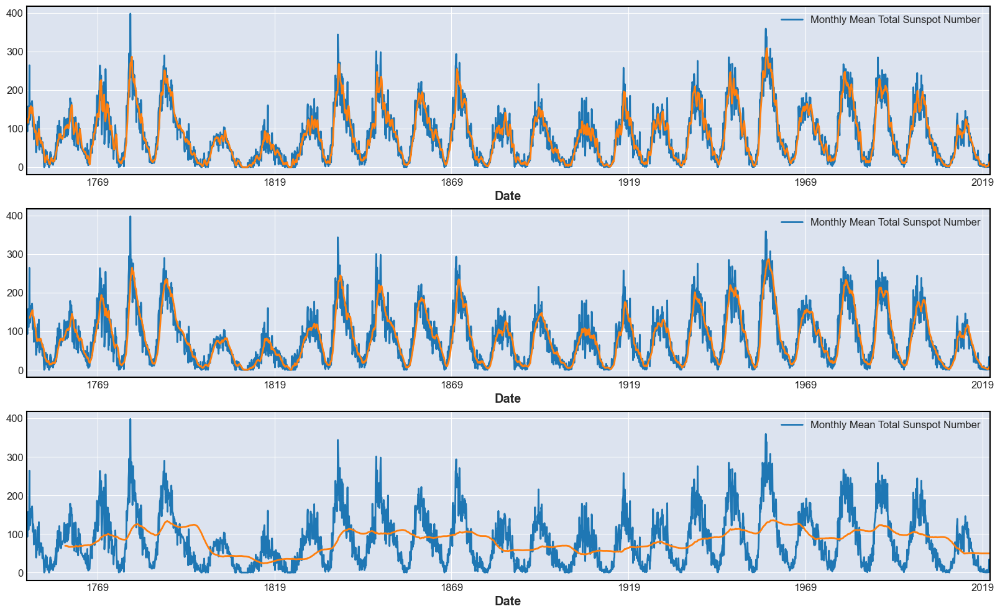

In [42]:
# load data
df_sun_spots = pd.read_csv('data/sunspots_TS/sunspots.zip', index_col='Date', parse_dates=True)\
    .drop('Unnamed: 0', axis=1)

fig, axes = plt.subplots(3, 1, figsize=(20, 12))

for i, window_size in enumerate([6, 12, 12 * 11]):
    rolling_mean = df_sun_spots['Monthly Mean Total Sunspot Number'].rolling(window_size).mean()

    # Plot original and smoothed time series data
    df_sun_spots.plot(ax=axes[i], label='Original Data')
    rolling_mean.plot(ax=axes[i], label=f'{window_size}-Month Moving Average')


#### Exponential smoothing
**Exponencial smoothing** is used to smooth the moving average values and reduce the noise in the data. It is calculated as a weighted moving average where the weights decrease exponentially as observations come from further in the past, the smallest weights are associated with the oldest observations.

The rate at which they decrease is controlled by a smoothing parameter, called alpha. The alpha parameter is often set to a value between 0 and 1. Larger values mean that recent observations have more weight and therefore more influence on the smoothed value. Smaller values mean that older observations have more weight and can result in predictions that change less radically over time. (see https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.ewm.html)

The values are calculated using the following formula:
$$ \left\{
        \begin{array}{ll}
        s_0 = x_0 \\
        s_t = \alpha x_t + (1-\alpha) s_{t-1} \\
        \end{array}
    \right.
$$
where $x_t$ is the observation at time $t$ and $s_t$ is the smoothed value at time $t$.  In other words, the smoothed statistic $s_t$ is a simple weighted average of the current observation $x_{t}$ and the previous smoothed statistic $s_{t-1}}$.

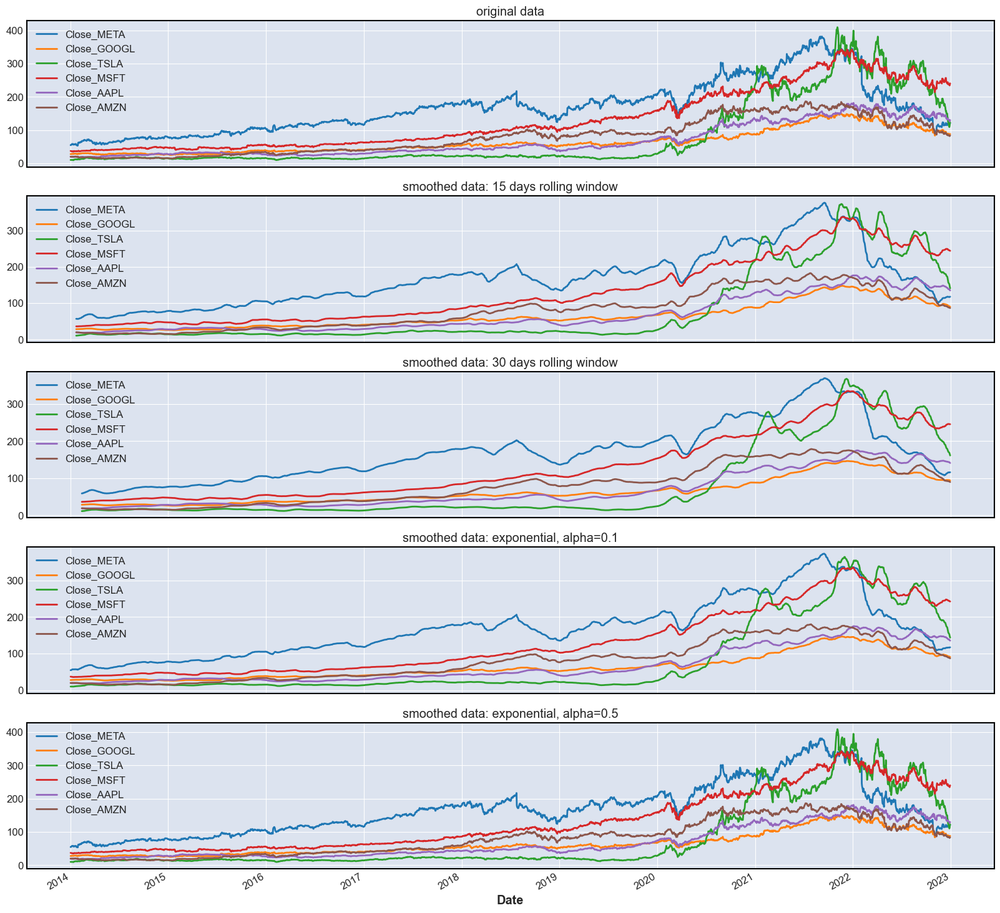

In [44]:
# compute the smoothed data using a rolling window, with a window size of 15 and 30 days
df_mva_15_days = df_close_14_22.rolling(window=15).mean()
df_mva_30_days = df_close_14_22.rolling(window=30).mean()

# compute the smoothed data using exponential smoothing, with alpha=0.1 and alpha=0.5
df_exp_alpha_01 = df_close_14_22.ewm(alpha=0.1).mean()
df_exp_alpha_05 = df_close_14_22.ewm(alpha=0.5).mean()

fig, ax = plt.subplots(5,1, sharex=True, figsize=(20,20))
# plot of the orignal data
_ = df_close_14_22.plot(ax=ax[0], title='original data')
_ = df_mva_15_days.plot(ax=ax[1], title='smoothed data: 15 days rolling window')
_ = df_mva_30_days.plot(ax=ax[2], title='smoothed data: 30 days rolling window')
_ = df_exp_alpha_01.plot(ax=ax[3], title='smoothed data: exponential, alpha=0.1')
_ = df_exp_alpha_05.plot(ax=ax[4], title='smoothed data: exponential, alpha=0.5')

## Stationarity
A series is said to be **stationary if its statistical properties such as mean, variance remain constant over time**. Most of the Time Series models work on the assumption that the TS is stationary.

Intuitively, we can say that if a time series has a particular behaviour over time, there is a very high probability that it will follow the same in the future. Also, the theories related to stationary series are more mature and easier to implement as compared to non-stationary series.

Let us see how to do it using the passengers' data.

,#Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121


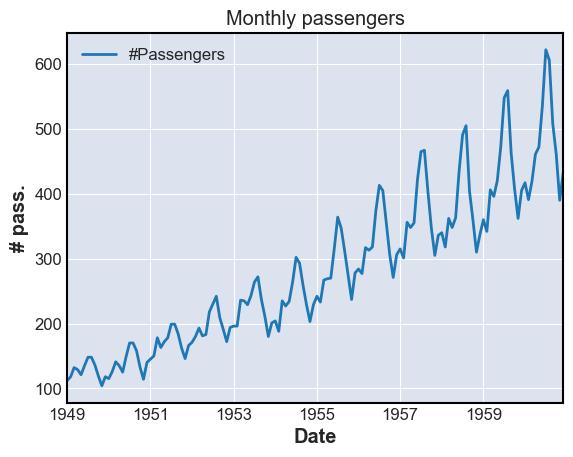

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# load time series data
df = pd.read_csv('./data/passengers_TS/passengers.csv', index_col='Month', parse_dates=True)
df.drop('Unnamed: 0', axis=1, inplace=True)


# plot the data
df.plot()
plt.xlabel('Date')
plt.ylabel('# pass.')
plt.title('Monthly passengers')

df.head()

As we can expeculate that, the data is not stationary. There is an increasing trend in the data. We can also see that the mean is not constant over time.

We can check stationarity using the following:

- **Plotting Rolling Statistics**: We can plot the moving average or moving variance and see if it varies with time. But again this is more of a visual technique.

- **Dickey-Fuller Test**: This is one of the statistical tests for checking stationarity. Here the **null hypothesis is that the TS is non-stationary**. The test results comprise of a test statistic and some critical values for difference confidence levels. If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and affirm that the series is stationary. This is the most commonly used method to check stationarity.

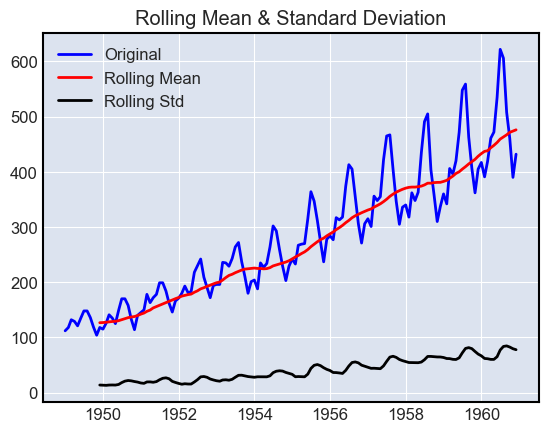

Results of Dickey-Fuller Test:
Test Statistic                   0.815369
p-value                          0.991880
#Lags Used                      13.000000
Number of Observations Used    130.000000
dtype: float64


In [46]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries, col_with_data):
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=12).mean()
    movingSTD = timeseries.rolling(window=12).std()

    #Plot rolling statistics
    plt.plot(timeseries, color='blue', label='Original')
    plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.plot(movingSTD, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(
        timeseries[col_with_data], # The data
        autolag='AIC'            # Akaike Information Criterion, i.e., the method to estimate the optimal lag
    )
    # Extract and display test results in a user friendly manner
    df_output = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    # for key, value in dftest[4].items():
    #     df_output['Critical Value (%s)'%key] = value
    print(df_output)

test_stationarity(df, col_with_data='#Passengers')

Since the p-value is greater than 0.05, we can say that the series is not stationary since we cannot reject the null hypothesis, i.e., by accepting the null hypothesis we are saying that the series is non-stationary.

#### Making the time series stationary
There are some major reasons to analyse to check the non-stationarity of a TS:
- **Trend** – varying mean over time. For e.g., in this case we saw that on average, the number of passengers was growing over time.
- **Seasonality** – variations at specific time-frames
- **Heteroskedasticity** - variance is increasing over time
- **Autocorrelation** - correlation between the values of the same variables at different time points
- **Cyclical** - regular up and down movements in the data that are not seasonal
- **Outliers** - data points that are far away from other data points
- **Level shifts** - sudden changes in the mean of the time series. E.g., the mean of the time series suddenly increases or decreases at a certain point in time because of some structural change in the process that’s generating the data.
- **Missing values** - missing data points in the time series.

We can see these easily in the plots above. Lets understand how to remove these.


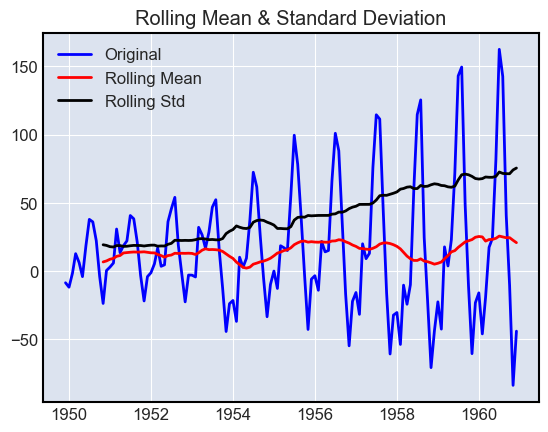

Results of Dickey-Fuller Test:
Test Statistic                  -3.164968
p-value                          0.022104
#Lags Used                      13.000000
Number of Observations Used    119.000000
dtype: float64


In [47]:
# Eliminating Trend - remember that we can remove trend by differencing
df_without_trend = df - df.rolling(window=12).mean()
df_without_trend.dropna(inplace=True)

test_stationarity(df_without_trend, col_with_data='#Passengers')

From the above plot, we can see that the mean is almost constant over time. Also, the test statistic is less than the critical value, so we can say that the series is stationary with 95% confidence.

However, we still can see that the standard deviation is increasing slightly over time. We can remove this by taking the log of the series.

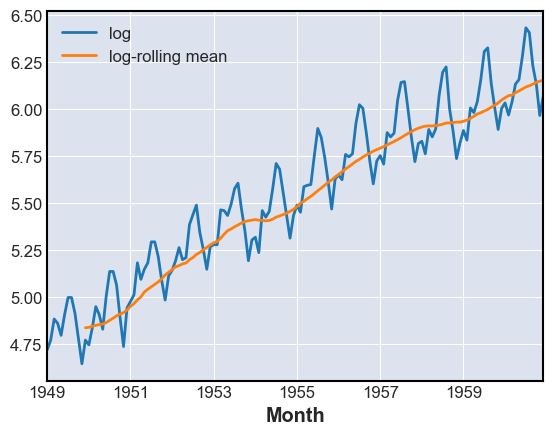

In [48]:
df_log = np.log(df)

ax = df_log.plot()
df_log.rolling(window=12).mean().plot(ax=ax)
ax.legend(['log', 'log-rolling mean'])

From the above plot, time series with log scale as well as Rolling Mean (moving avg) both have the trend component. Thus subtracting one from the other should remove the trend component.

<Axes: xlabel='Month'>

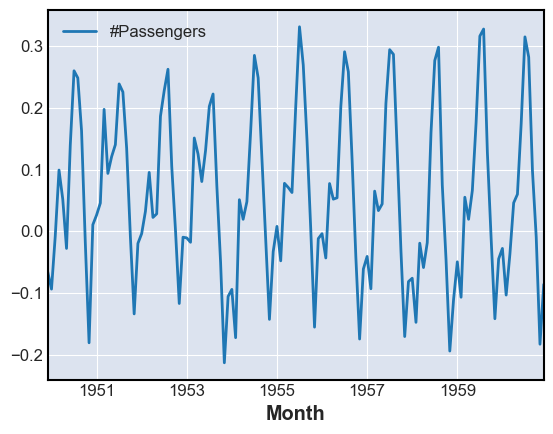

In [49]:
rollmean_log = df_log.rolling(window=12).mean()
df_stat = df_log - rollmean_log
df_stat.dropna(inplace=True)
df_stat.plot()

Now, let us perform the Dickey-Fuller test again on the resultant series.

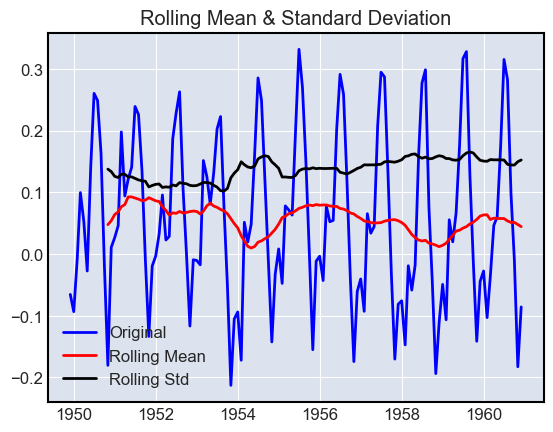

Results of Dickey-Fuller Test:
Test Statistic                  -3.162908
p-value                          0.022235
#Lags Used                      13.000000
Number of Observations Used    119.000000
dtype: float64


In [50]:
test_stationarity(df_stat, col_with_data='#Passengers')

From the above plot, we came to know that "indeed subtracting two related series having similar trend components actually removed trend and made the dataset stationary"

Also, after concluding the results from ADFC test: p-value has reduced to 0.022, so we can say that the series is stationary with 95% confidence.

## Decomposition

Already seen in a previous section, decomposing a time series involves breaking down a time series data into its individual components in order to better understand the underlying patterns and trends. The three main components of a time series are:

- __Trend__ - the long-term direction of the data over time. It represents the overall tendency of the series to increase, decrease, or remain relatively constant over time.

- __Seasonality__ - the pattern of variations that occur within a specific time period, such as a day, week, month, or year. Seasonality is often due to predictable factors such as weather, holidays, or events.

- __Random or irregular component__ - the unpredictable fluctuations or noise that cannot be explained by the trend or seasonality.

By decomposing a time series into these three components, it becomes easier to identify and analyze the patterns and trends that may be occurring in the data. This can be particularly useful in forecasting future values and making informed decisions based on the insights gained from the analysis.

#### Air passengers dataset
Let us recall some examples. For the passengers dataset, for instance it is obvious the trend and the seasonality

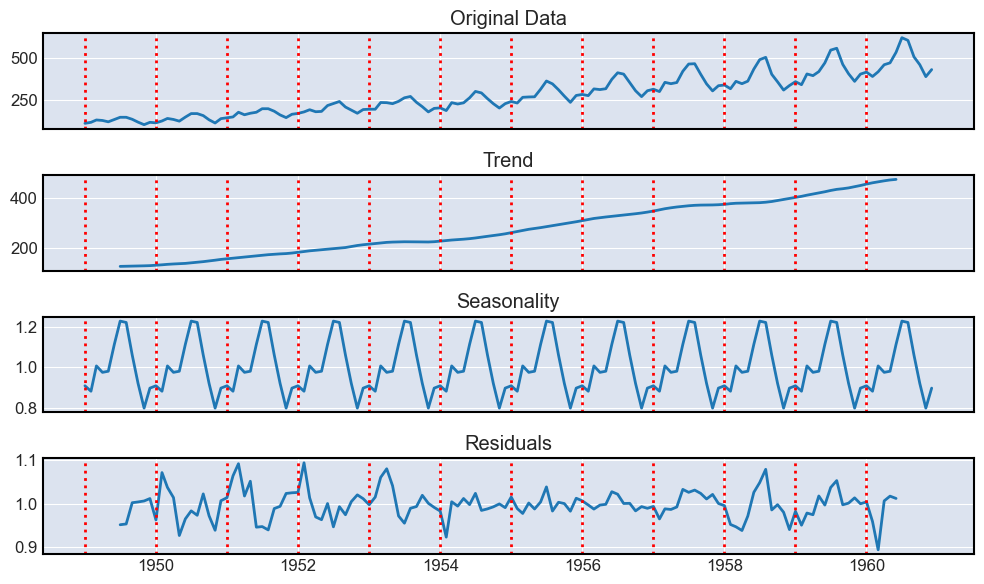

In [51]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Load time series data
df_passengers = pd.read_csv('./data/passengers_TS/passengers.csv', index_col='Month', parse_dates=True)
df_passengers.drop("Unnamed: 0", axis=1, inplace=True)

# Perform  decomposition using the seasonal_decompose function from statsmodels
decomposition = seasonal_decompose(df_passengers, model='multiplicative')

# Plot the decomposition components
fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(10,6))

axes[0].plot(df_passengers)
axes[0].set_title('Original Data')

axes[1].plot(decomposition.trend)
axes[1].set_title('Trend')

axes[2].plot(decomposition.seasonal)
axes[2].set_title('Seasonality')

axes[3].plot(decomposition.resid)
axes[3].set_title('Residuals')

# plot vertical dashed red lines each year
for i in range(4):
    for date in pd.date_range("1949", "1960", 1960-1949+1):
        axes[i].axvline(date, color="red", linestyle=":")

plt.tight_layout() # to avoid overlapping of the subplots
plt.show()

#### Sun spots dataset
Let us see another example. The sun spots dataset is a time series data that represents the number of sun spots that were observed each year from 1749 to 2017. Let us a similar decomposition for this dataset. It was found that there a cycle of ~11 years in the data.

In [52]:
# Load time series data
df_sun_spots = pd.read_csv('./data/sunspots_TS/sunspots.zip', index_col='Date', parse_dates=True)
df_sun_spots.drop("Unnamed: 0", axis=1, inplace=True)
df_sun_spots

,Monthly Mean Total Sunspot Number
Date,
1749-01-31,96.7
1749-02-28,104.3
1749-03-31,116.7
1749-04-30,92.8
1749-05-31,141.7
...,...
2020-09-30,0.6
2020-10-31,14.4
2020-11-30,34.0


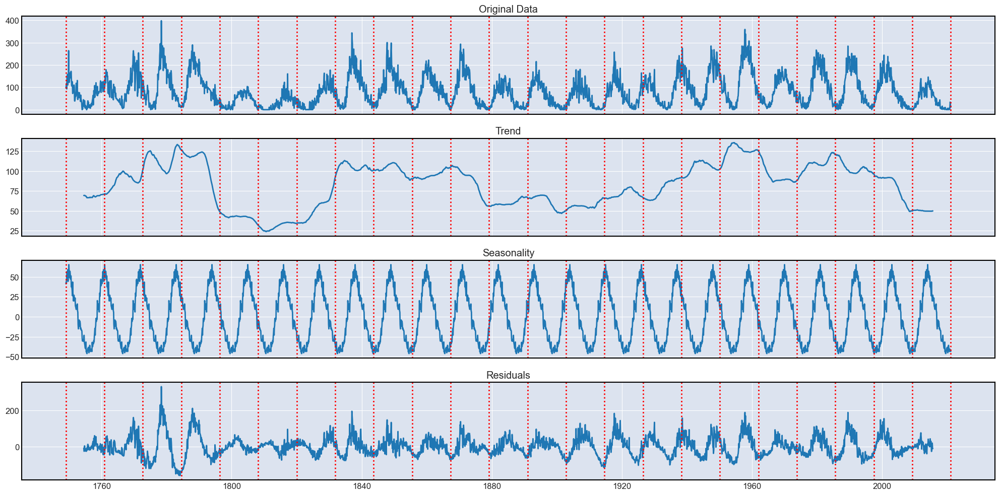

In [53]:
# Perform  decomposition
decomposition = seasonal_decompose(df_sun_spots, model='additive', period=11*12) # decompose with a 11*12 period

# Plot the decomposition components
fig, axes = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(20,10))

axes[0].plot(df_sun_spots)
axes[0].set_title('Original Data')

axes[1].plot(decomposition.trend)
axes[1].set_title('Trend')

axes[2].plot(decomposition.seasonal)
axes[2].set_title('Seasonality')

axes[3].plot(decomposition.resid)
axes[3].set_title('Residuals')

# plot vertical dashed red lines
for i in range(4):
    for date in pd.date_range("1749-01-31", "2021-01-31", int((2021-1749)/11)):
        axes[i].axvline(date, color="red", linestyle=":")

plt.tight_layout()
plt.show()

Lets us also performe the ADFC test

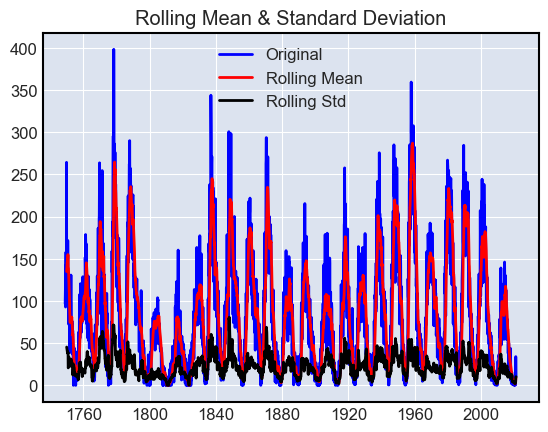

Results of Dickey-Fuller Test:
Test Statistic                -1.049705e+01
p-value                        1.108552e-18
#Lags Used                     2.800000e+01
Number of Observations Used    3.236000e+03
dtype: float64


In [54]:
test_stationarity(df_sun_spots, col_with_data='Monthly Mean Total Sunspot Number')

Since p-value is approx. 0, the null hypothesis, which is that the time series is non-stationary, is rejected and we can say that the series is stationary with 95% confidence.

## Autocorrelation

**Autocorrelation** is a statistical concept that **measures the correlation between a time series and a lagged version of itself**. In other words, it measures how much a time series is correlated with its own past values at different time lags.

To calculate the autocorrelation of a time series in Python, we can use the autocorrelation plot and acf functions from the statsmodels library.

The plot generated by the plot_acf function shows the autocorrelation function (ACF) for a time series. The ACF measures the correlation between a time series and a lagged version of itself at different time lags.

In the plot, the "horizontal" axis represents the lag at which the autocorrelation is calculated, while the "vertical" axis represents the value of the autocorrelation coefficient (between -1 and 1).

The _shaded blue_ region in the plot represents the confidence intervals for the autocorrelation coefficient. Any autocorrelation coefficient that falls outside these intervals is considered statistically significant, indicating that there is likely some correlation between the time series and its lagged values at that particular lag.

So, to interpret the plot, we can look for significant autocorrelation coefficients that fall outside the confidence intervals. These indicate that the time series is correlated with its lagged values at those lags. For example, if there is a significant positive autocorrelation at a lag of 1, this suggests that each value in the time series is positively correlated with the value that immediately precedes it.

We can also look at the pattern of the autocorrelation coefficients to identify any underlying seasonality or trend in the data. For example, if there is a significant positive autocorrelation at a lag of 12, this suggests that there is a seasonal pattern with a period of 12 months in the data.

#### Air passengers dataset

We can observe that until lag of 12 (approx.), the autocorrelation coefficients are positive and significant. This suggests that each value in the time series is positively correlated with the value that immediately precedes it. Also, there is an increase in the autocorrelation coefficients at lag 12, which suggests that there is a seasonal pattern with a period of 12 months in the data.

Autocorrelation coefficients:
 [1.         0.94804734 0.87557484 0.80668116 0.75262542 0.71376997
 0.6817336  0.66290439 0.65561048 0.67094833 0.70271992 0.74324019
 0.76039504 0.71266087 0.64634228 0.58592342 0.53795519 0.49974753
 0.46873401 0.44987066 0.4416288  0.45722376 0.48248203 0.51712699
 0.53218983]
[1.         0.94804734 0.87557484 0.80668116 0.75262542 0.71376997
 0.6817336  0.66290439 0.65561048 0.67094833 0.70271992 0.74324019
 0.76039504 0.71266087 0.64634228 0.58592342 0.53795519 0.49974753
 0.46873401 0.44987066 0.4416288  0.45722376 0.48248203 0.51712699
 0.53218983]


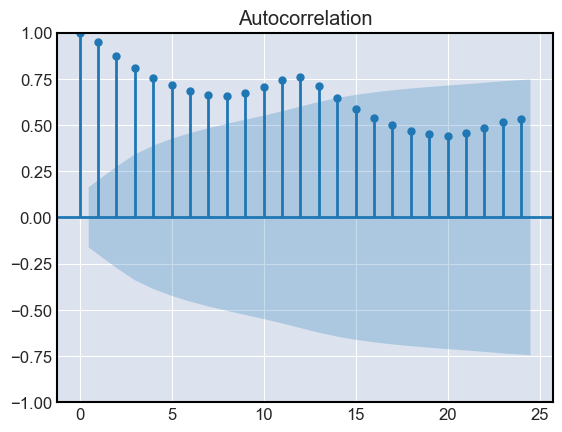

In [56]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf

# Calculate the autocorrelation coefficients
autocorr = acf(df_passengers['#Passengers'], nlags=24)
print('Autocorrelation coefficients:\n', autocorr)
print(autocorr)

# Plot the autocorrelation function
plot_acf(df_passengers['#Passengers'], lags=24)
plt.show()

#### Sun spots dataset
We can observe that the autocorrelation changes monotony in cycles of ~11 years. This suggests that there is a seasonal pattern with a period of 11 years in the data. Also the autocorrelation sign changes around 5.5 years due to the incresing and decreasing cycles of the sun spots.

Autocorrelation coefficients:
 [ 1.          0.91808438  0.8857537   0.86971152  0.85910958  0.84438871
  0.83158072  0.81295423  0.79943888  0.78977109  0.76975984  0.74750969
  0.72393583  0.69830327  0.67552647  0.65008365  0.6177455   0.58816344
  0.55493809  0.52690648  0.49624284  0.46299719  0.43490557  0.40811683
  0.37263016  0.34767012  0.3144977   0.27543255  0.24121263  0.20808995
  0.17920883  0.14585621  0.11831062  0.08393136  0.05082625  0.01949117
 -0.01001733 -0.03889683 -0.0665587  -0.09542182 -0.11874015 -0.14461667
 -0.17025043 -0.19612623 -0.21643774 -0.23781975 -0.26006393 -0.27898684
 -0.29901634 -0.31830779 -0.33345736 -0.34737622 -0.35951616 -0.37321067
 -0.38568709 -0.39854351 -0.40797344 -0.41863072 -0.42743741 -0.43420108
 -0.43537483 -0.43747458 -0.43857215 -0.43962157 -0.43667697 -0.43562744
 -0.43441571 -0.42728751 -0.42347797 -0.41737097 -0.40750325 -0.39874971
 -0.3889469  -0.37535843 -0.36577745 -0.35207739 -0.33581768 -0.32195062
 -0.30804209 -0.2903

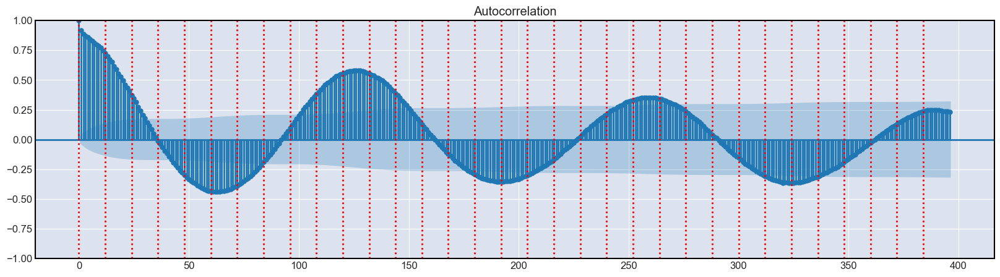

In [57]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf

# use 3 cycles of 11 years
nlags = 11*12*3

fig, ax = plt.subplots(figsize=(20,5))

# Calculate the autocorrelation coefficients
autocorr = acf(df_sun_spots['Monthly Mean Total Sunspot Number'], nlags=nlags)
print('Autocorrelation coefficients:\n', autocorr)
print(autocorr)

# Plot the autocorrelation function
plot_acf(df_sun_spots['Monthly Mean Total Sunspot Number'], ax=ax, lags=nlags)

# plot vertical dashed red lines at each 12 months
for date in range(0, nlags, 12):
        ax.axvline(date, color="red", linestyle=":")

plt.show()

## Spectral analysis

Spectral analysis is a technique used in time series analysis to decompose a signal into its frequency components. The resulting frequency domain representation can help identify periodicities and patterns in the data that may not be apparent in the time domain. (See for example this video for an intuitive explanation of spectral analysis: https://www.youtube.com/watch?v=spUNpyF58BY

In spectral analysis, we use the Fourier transform to convert a time series from the time domain to the frequency domain. The Fourier transform represents the time series as a sum of sine and cosine waves with different frequencies and amplitudes. This allows us to identify the specific frequencies that contribute to the overall behavior of the time series, and to analyze the data in terms of its periodicities.

The resulting frequency domain representation is typically visualized by ploting the amplitude of each frequency component against the frequency.

Spectral analysis can be useful for a variety of applications, including identifying seasonal patterns in economic or climate data, detecting periodicities in physiological signals, and analyzing fluctuations in financial markets. It can also be used to filter out noise or unwanted frequency components from a time series, allowing us to focus on the specific frequencies that are most relevant to the analysis at hand.

Let us see some examples.

#### Passengers' dataset
First let us analyse the passengers data:

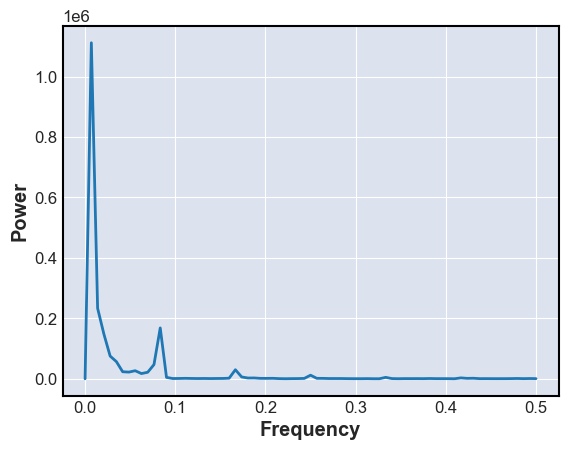

In [58]:
from scipy.signal import periodogram

# Compute the periodogram - The periodogram function returns two arrays:
# freq, which contains the frequencies, and
# power, which contains the power at each frequency.
freq, power = periodogram(df_passengers['#Passengers'])

# Plot the power spectrum
plt.plot(freq, power)
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.show()

We can see 2 peaks in the power values with valueas above ~190,000 with a frequency arround 0.01 and 0.08. Let us try to find that value and from the frequency find the periodicity (we will use 50,000 which will also catch some of the other lower peaks - see the periodicity of ~12x$n$ months!)

In [59]:
peak_freq = freq[np.where(power > 50000)]
print('peak value', peak_freq)
print('periodicity', 1/peak_freq)

peak value [0.00694444 0.01388889 0.02083333 0.02777778 0.03472222 0.08333333]
periodicity [144.   72.   48.   36.   28.8  12. ]


#### Sun spots dataset
And now a similar analysis for the sun spots data

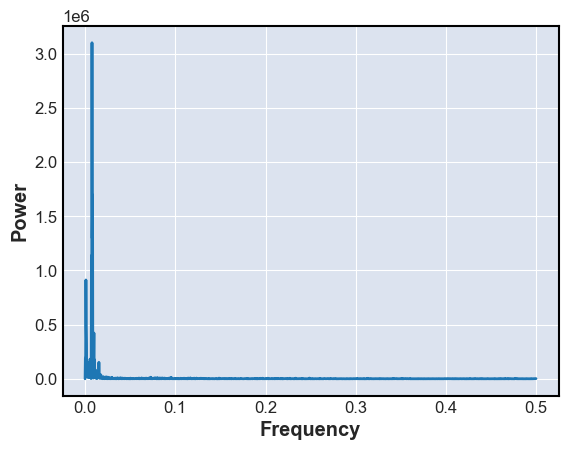

In [60]:
from scipy.signal import periodogram

# Compute the periodogram
freq, power = periodogram(df_sun_spots['Monthly Mean Total Sunspot Number'])

# Plot the power spectrum
plt.plot(freq, power)
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.show()

We can see the peak in the power of >3,000,000. Let us try to find that value and from the frequency above $10^6$ and from there find the (~11 year) periodicity

In [61]:
peak_freq = freq[np.where((power>10**6) )]
print('peak value:', peak_freq)
print('seasonality:', 1/peak_freq)
print('divided by 12 (months) to get the values in years:', 1/peak_freq/12)

peak value: [0.00704441 0.00765697 0.00796325 0.00826953]
seasonality: [141.95652174 130.6        125.57692308 120.92592593]
divided by 12 (months) to get the values in years: [11.82971014 10.88333333 10.46474359 10.07716049]


## Clustering and classification

Clustering and classification techniques can be used to group similar time series together or classify them based on certain characteristics, which can provide insights into patterns or trends across multiple time series.

In [62]:
from sklearn.cluster import KMeans

# compute the variation of the stocks over the quarters
df_delta_quarter = compute_variation(df_stocks, 'QE')
df_delta_quarter.dropna(inplace=True)
# Clustering using K-Means
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10).fit(df_delta_quarter)
clusters = kmeans.predict(df_delta_quarter)
clusters

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 2, 2, 0, 2, 1],
      dtype=int32)

Plotting the data, maybe the cluster are small, medium and large variations in the stocks value?

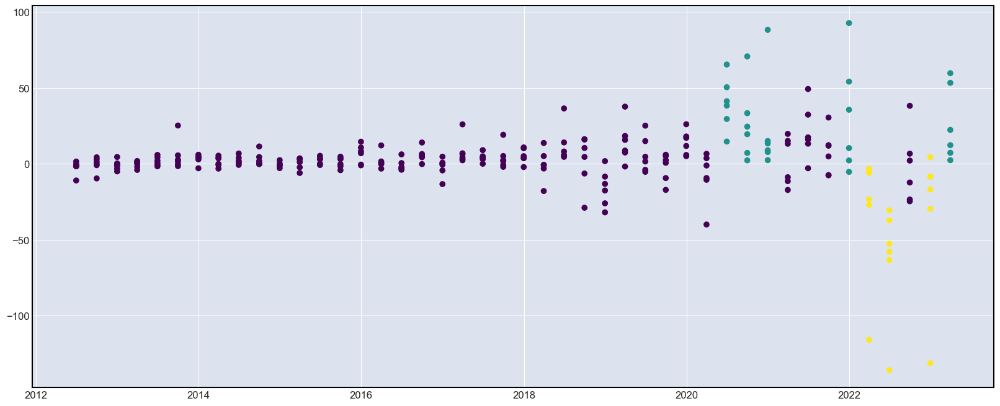

In [63]:
# Plot clusters
fig, ax = plt.subplots(figsize=(20,8))
for col in list_of_stocks:
    ax.scatter(df_delta_quarter.index, df_delta_quarter[col], c=clusters, cmap='viridis')

## Correlation analysis
Correlation analysis can be used to examine the relationship between a time series and other variables, such as economic indicators or weather data.

Correlation analysis is a widely used technique in time series analysis to study the relationship between two or more time series. Correlation analysis is used to determine whether and to what extent two time series are related to each other, and to identify patterns and trends in the data.

There are two main types of correlation analysis that can be applied to time series data:

- **Cross-correlation analysis**: Cross-correlation measures the similarity between two time series as a function of the time lag applied to one of them. Cross-correlation analysis can be used to identify the time lag that maximizes the correlation between the two time series, which can be useful for synchronizing data recorded at different times. Cross-correlation analysis can also be used to identify leading and lagging time series, which can help predict future behavior.

- **Auto-correlation analysis**: as seen above auto-correlation measures the correlation between a time series and a lagged version of itself.

Let us see an example supported on the stocks data

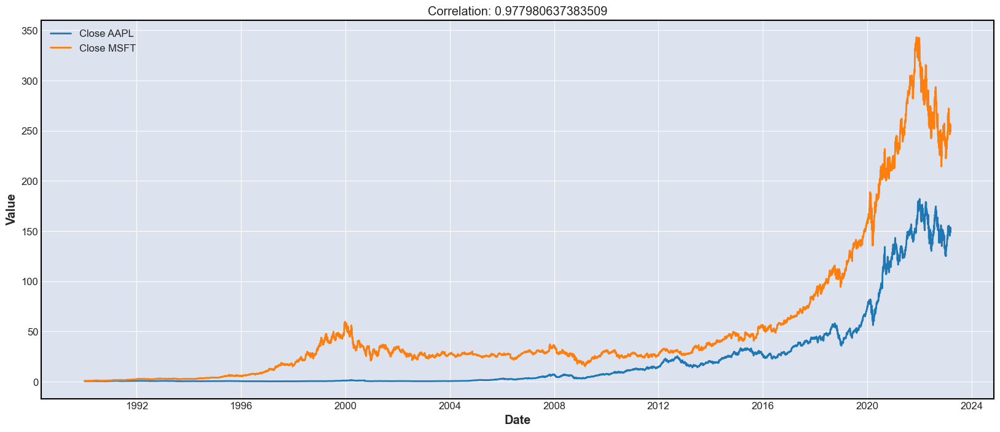

In [64]:
# Calculate cross-correlation between AAPL and META
corr = df_stocks['Close_AAPL'].corr(df_stocks['Close_MSFT'])

# Plot time series data
plt.figure(figsize=(20,8))

plt.plot(df_stocks.index, df_stocks['Close_AAPL'], label='Close AAPL')
plt.plot(df_stocks.index, df_stocks['Close_MSFT'], label='Close MSFT')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Correlation: ' + str(corr))
plt.show()

To compute the cross-correlation between the stocks data and the S&P 500 index, we can use the Pandas corrwith function, which computes the correlation between two DataFrames along their common index.

[0.9702447583135263, 0.9704669039839371, 0.9706849202717486, 0.9709033025160055, 0.9711127590997367, 0.9713341223542176, 0.9715650866228697, 0.9718201420381974, 0.9720691926305948, 0.9723450145553242, 0.9726021021395858, 0.9728754251548646, 0.9731428495327262, 0.9733754295577058, 0.9736436452988277, 0.9738832064430971, 0.9741541616210918, 0.9744173472116061, 0.9746846828325187, 0.9749559511104053, 0.9752110997444418, 0.975500290485274, 0.9757512117780447, 0.9760289840147877, 0.976271990357084, 0.9765355286365761, 0.9767749347521131, 0.9770178423287196, 0.9773099064584693, 0.977621091688917, 0.977980637383509, 0.977941358107518, 0.9779264006305118, 0.9779135045694232, 0.9778839127121169, 0.9778435988160213, 0.977776538090446, 0.9777463192845177, 0.97767818678055, 0.977661278839478, 0.9775926421933617, 0.9775564626627964, 0.977518802052891, 0.9774879789479587, 0.9774730548136411, 0.9774402761495391, 0.9774413180766808, 0.9774427687208125, 0.9774423253046693, 0.9774043522572949, 0.9773651

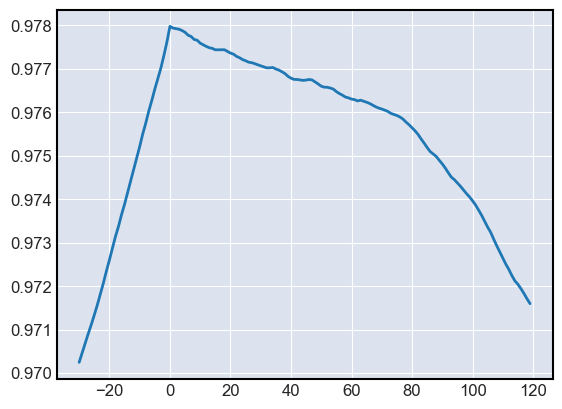

In [65]:
# Compute cross-correlation between AAPL and META
list_of_lags = range(-30, 120)
cross_corr = [df_stocks['Close_AAPL'].corr(df_stocks['Close_MSFT'].shift(lag)) for lag in list_of_lags]
print(cross_corr)
plt.plot(list_of_lags, cross_corr)

## Granger causality analysis (optional)

Granger causality analysis is a statistical technique used to **investigate the causal relationship between two time series variables**. It is widely used in economics, finance, neuroscience, and other fields to study cause-and-effect relationships in time series data.

The basic idea behind Granger causality analysis is to **test whether the past values of one time series variable can predict the future values of another time series variable**, over and above the effects of the other variable's own past values. If the past values of one variable can help predict the future values of the other variable, then it is said to have Granger-caused the other variable.

Granger causality analysis typically involves the following steps:

- Estimate the autoregressive models for each variable: This involves fitting a linear regression model to each time series variable, using its past values as predictors.

- Test for Granger causality: This involves comparing the performance of the two models (with and without the lagged values of the first variable) using statistical tests such as the F-test or likelihood ratio test. If the inclusion of the lagged values of the first variable significantly improves the performance of the model, then it is said to Granger-cause the second variable.

Granger causality analysis has some limitations and caveats that should be considered. For example, Granger causality analysis does not imply causality in a strict sense, and it cannot rule out the possibility of reverse causality or the presence of unobserved confounding variables. It also assumes that the time series data is stationary and linear, which may not be true for all applications. However, despite these limitations, Granger causality analysis can provide valuable insights into the causal relationships between time series variables and can help inform decision-making in various domains.

Let us see an example with the stock market time series

In [66]:
from statsmodels.tsa.stattools import grangercausalitytests

maxlag=15
test = 'ssr_chi2test'

def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):
    _df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in _df.columns:
        for r in _df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            _df.loc[r, c] = min_p_value
    _df.columns = [var + '_x' for var in variables]
    _df.index = [var + '_y' for var in variables]
    return _df

grangers_causation_matrix(df_stocks[close_cols].dropna(), variables = df_stocks[close_cols].columns)

/Users/pcardoso/anaconda3/envs/IDC_env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/pcardoso/anaconda3/envs/IDC_env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/pcardoso/anaconda3/envs/IDC_env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/pcardoso/anaconda3/envs/IDC_env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/pcardoso/anaconda3/envs/IDC_env/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/Users/pca

,Close_META_x,Close_GOOGL_x,Close_TSLA_x,Close_MSFT_x,Close_AAPL_x,Close_AMZN_x
Close_META_y,1.0000,0.0000,0.0000,0.0,0.0001,0.0356
Close_GOOGL_y,0.0004,1.0000,0.0000,0.0,0.0017,0.0001
Close_TSLA_y,0.0000,0.0000,1.0000,0.0,0.0002,0.0000
Close_MSFT_y,0.0002,0.0002,0.0001,1.0,0.0000,0.0011
Close_AAPL_y,0.0000,0.0000,0.1011,0.0,1.0000,0.0000
Close_AMZN_y,0.0000,0.0000,0.0000,0.0,0.0000,1.0000


The row are the response (y) and the columns are the predictors (x). If a given p-value is less than the significance level (0.05) (for example, take the value 0.0 in (row 1, column 2)), we can reject the null hypothesis and conclude that Close_META_x Granger causes Close_GOOGL_x. Likewise, the 0.0004 in (row 2, column 1) refers to Close_GOOGLE_y Granger causes Close_META_x. The only case that misses the test is the Close_AAPL_y vs Close_TSLA_x, meaning that we cannot conclude that Close_AAPL_y Granger causes Close_TSLA_x.